In [ ]:
import os
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torch.optim as optim
from tqdm import tqdm
import random
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


# **CREAZIONE DATASET**

In [ ]:
class StrawberryDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transform = None, mask_transform = None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform

        self.images = []
        self.masks = []

        for image in os.listdir(image_dir) :
            self.images.append(os.path.join(image_dir,image))
            self.masks.append(os.path.join(mask_dir,image))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert("RGB")
        mask = Image.open(self.masks[idx]).convert("L")

        if self.image_transform:
            image = self.image_transform(image)

        if self.mask_transform:
            mask = self.mask_transform(mask)
            mask = (mask>0).float()

        return image, mask

In [ ]:
#Trasformazioni per le immagini
image_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])


#Trasformazioni per le maschere
mask_transform = transforms.Compose([
    transforms.Resize((256,256), interpolation = transforms.InterpolationMode.NEAREST),
    transforms.ToTensor(),
])

# **RETE U_NET**






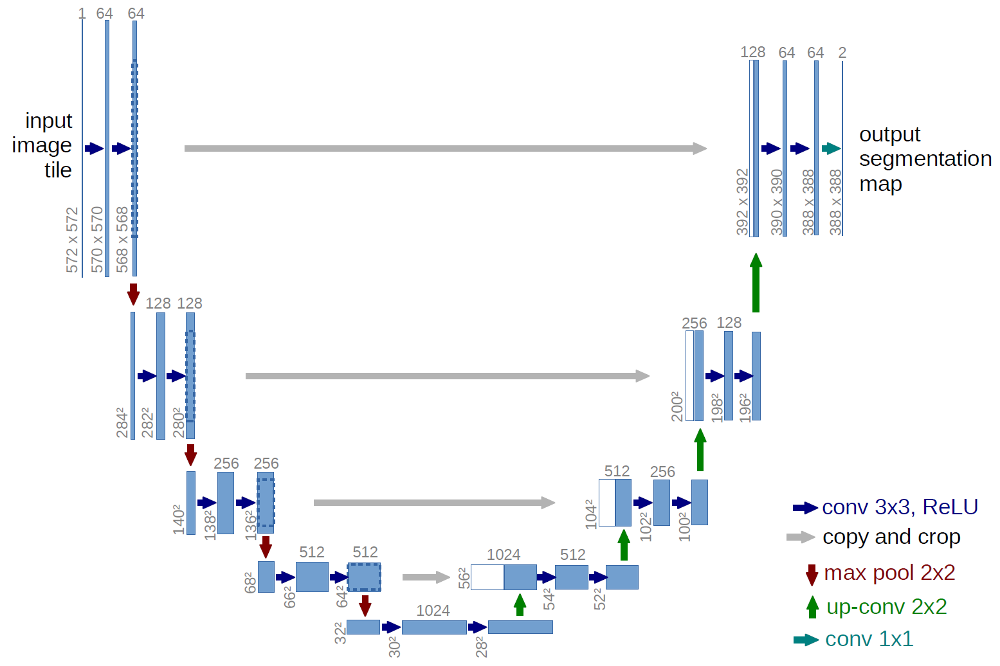

In [ ]:
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()

        #Fase di encoder
        self.enc1 = self.double_conv(in_channels, 64)
        self.enc2 = self.double_conv(64, 128)
        self.enc3 = self.double_conv(128, 256)
        self.enc4 = self.double_conv(256, 512)

        #Dropout
        self.dropout = nn.Dropout(p=0.2)

        #Bottleneck
        self.bottleneck = self.double_conv(512, 1024)

        #Fase di decoder
        self.upconv4 = self.upconv(1024, 512)
        self.upconv3 = self.upconv(512, 256)
        self.upconv2 = self.upconv(256, 128)
        self.upconv1 = self.upconv(128,64)

        self.dec4 = self.double_conv(1024, 512)
        self.dec3 = self.double_conv(512, 256)
        self.dec2 = self.double_conv(256, 128)
        self.dec1 = self.double_conv(128, 64)

        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def double_conv(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.2)
        )

    def upconv(self, in_channels, out_channels):
        return nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)


    def forward(self, x):
        #Fase di encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(nn.MaxPool2d(2)(enc1))
        enc3 = self.enc3(nn.MaxPool2d(2)(enc2))
        enc4 = self.enc4(nn.MaxPool2d(2)(enc3))

        #Bottleneck
        bottleneck = self.bottleneck(nn.MaxPool2d(2)(enc4))

        #Dropout
        bottleneck = self.dropout(bottleneck)

        #Fase di decoder
        upconv4 = self.upconv4(bottleneck)
        upconv4 = torch.cat([upconv4, enc4], dim=1)
        dec4 = self.dec4(upconv4)

        upconv3 = self.upconv3(dec4)
        upconv3 = torch.cat([upconv3, enc3], dim=1)
        dec3 = self.dec3(upconv3)

        upconv2 = self.upconv2(dec3)
        upconv2 = torch.cat([upconv2, enc2], dim=1)
        dec2 = self.dec2(upconv2)

        upconv1 = self.upconv1(dec2)
        upconv1 = torch.cat([upconv1, enc1], dim=1)
        dec1 = self.dec1(upconv1)

        return self.final_conv(dec1)

# **DICE COEFFICIENT E INTERSECTION OVER UNION(IoU)**

In [ ]:
def dice_coeff(preds, masks):
  preds = (torch.sigmoid(preds) > 0.5).float()
  intersection = (preds * masks).sum()
  union = preds.sum() + masks.sum()

  dice = (2.0 * intersection + 1e-8) / (union + 1e-8)
  return dice

def iou_coeff(preds, masks):
  preds = (torch.sigmoid(preds) > 0.5).float()
  intersection = (preds * masks).sum()
  union = preds.sum() + masks.sum() - intersection

  iou = (intersection + 1e-8) / (union + 1e-8)
  return iou

# **TRAINING E VALIDATION**

In [ ]:
def train_and_validate(model, train_loader, validation_loader, device, optimizer, criterion, epochs):
    train_losses = []
    val_losses = []
    train_dice = []
    val_dice = []
    train_iou = []
    val_iou = []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        total_dice = 0.0
        total_iou = 0.0
        total = 0

        #Addestramento
        with tqdm(train_loader, desc=f"Epoch {epoch+1} Training", unit="batch") as tepoch:
          for images, masks in tepoch:

              images, masks = images.to(device), masks.to(device)

              optimizer.zero_grad()

              outputs = model(images)

              loss = criterion(outputs, masks)
              running_loss += loss.item() * images.size(0)
              loss.backward()
              torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0) #Prevengo l'esplosione dei gradienti

              optimizer.step()

              dice = dice_coeff(outputs, masks)
              total_dice += dice.item() * images.size(0)

              iou = iou_coeff(outputs, masks)
              total_iou += iou.item() * images.size(0)

              total += images.size(0)

              tepoch.write(f"Training Loss: {loss.item():.4f}")


        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_dice = total_dice / total
        epoch_iou = total_iou / total
        train_losses.append(epoch_loss)
        train_dice.append(epoch_dice)
        train_iou.append(epoch_iou)

        print('\n')
        #Validazione
        model.eval()
        running_loss = 0.0
        total_dice = 0.0
        total_iou = 0.0
        total = 0

        with torch.no_grad():
          with tqdm(validation_loader, desc=f"Epoch {epoch+1} Validation", unit="batch") as tepoch:
            for images, masks in tepoch:

                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                loss = criterion(outputs, masks)
                running_loss += loss.item() * images.size(0)

                dice = dice_coeff(outputs, masks)
                total_dice += dice.item() * images.size(0)

                iou = iou_coeff(outputs, masks)
                total_iou += iou.item() * images.size(0)

                total += images.size(0)

                tepoch.write(f"Validation Loss: {loss.item():.4f}")


        val_loss = running_loss / len(validation_loader.dataset)
        validation_dice = total_dice / total
        validation_iou = total_iou / total
        val_losses.append(val_loss)
        val_dice.append(validation_dice)
        val_iou.append(validation_iou)

        print(f'Epoch {epoch + 1}, Validation Loss: {val_loss:.4f}, Validation Dice: {validation_dice:.4f}, Validation IoU: {validation_iou:.4f}')
        print('\n')

    return train_losses, val_losses, train_dice, val_dice, train_iou, val_iou




# **HYPERPARAMETER TUNING**

In [ ]:
def random_hyperparameters():
    lr = random.choice([1e-2, 1e-3, 1e-4])
    batch_size = random.choice([16, 32, 64])
    weight_decay = random.choice([1e-3, 1e-4])

    return lr, batch_size, weight_decay

def hyperparameter_tuning(trainset, validationset, criterion, device, num_trials=10, num_epochs=5):
    best_loss = float('inf')
    best_params = None
    best_model_wts = None

    for trial in range(num_trials):
        lr, batch_size, weight_decay = random_hyperparameters()
        print(f'Trial {trial+1}/{num_trials} --> learning rate = {lr}, batch_size = {batch_size}, weight_decay = {weight_decay}')

        model = UNet(in_channels=3, out_channels=1).to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)

        train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
        validation_loader = DataLoader(validationset, batch_size=batch_size, shuffle=False)

        train_losses, val_losses, train_dice, val_dice, train_iou, val_iou = train_and_validate(model, train_loader, validation_loader, device, optimizer, criterion, num_epochs)

        bvloss = min(val_losses)
        if (bvloss < best_loss):
            best_loss = bvloss
            best_params = (lr, batch_size, weight_decay)
            best_model_wts = model.state_dict()

        #Rappresentazione grafica
        plt.figure(figsize=(18,12))

        plt.subplot(2, 2, 1)
        plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss', color='red')
        plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Trial {trial + 1} - Loss (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 2)
        plt.plot(range(1, num_epochs+1), train_dice, label='Train Dice', color='red')
        plt.plot(range(1, num_epochs+1), val_dice, label='Validation Dice', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Dice Coefficient')
        plt.title(f'Trial {trial + 1} - Accuracy (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(2, 2, 3)
        plt.plot(range(1, num_epochs+1), train_iou, label='Train IoU', color='red')
        plt.plot(range(1, num_epochs+1), val_iou, label='Validation IoU', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('IoU')
        plt.title(f'Trial {trial + 1} - Accuracy (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()
        plt.show()

        print('\n')

    print(f'Best validation loss: {best_loss}')
    print(f'Best params: learning rate = {best_params[0]}, batch size = {best_params[1]}, weight_decay = {best_params[2]}')
    torch.save(best_model_wts, 'best_model.pth')

    return best_params

# **FAILURE ANALYSIS**

In [20]:
def show_predictions(images, masks, predictions, num_images=5, title=None):
    def overlay(image, mask):
        image = image.permute(1, 2, 0).cpu().numpy()
        mask = mask.squeeze().cpu().numpy()

        color = np.zeros_like(image)
        color[mask > 0] = [0, 255, 255]

        return np.clip(image * 0.5 + color * 0.5, 0, 1)


    fig, axes = plt.subplots(nrows=num_images, ncols=3, figsize=(15, num_images*5))

    if title:
        fig.suptitle(title, fontsize=16, y=0.95)

    for i in range(num_images):
        ax = axes[i]
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        ax[0].imshow(image.permute(1, 2, 0).cpu().numpy())
        ax[0].set_title("Image")
        ax[0].axis('off')

        image_mask = overlay(image, mask)
        ax[1].imshow(image_mask)
        ax[1].set_title("Image + Mask")
        ax[1].axis('off')

        image_prediction = overlay(image, prediction)
        ax[2].imshow(image_prediction)
        ax[2].set_title("Image + Prediction")
        ax[2].axis('off')

    plt.tight_layout()
    plt.show()


def failure_analysis(model, criterion, testset, best_params, device):
    print('TESTING...')
    model.eval()
    test_loss = 0.0
    total_dice = 0.0
    total_iou = 0.0
    total = 0
    images_list = []
    masks_list = []
    preds_list = []

    test_loader = DataLoader(testset, batch_size=best_params[1], shuffle=False)

    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)
            test_loss += loss.item() * images.size(0)

            dice = dice_coeff(outputs, masks)
            total_dice += dice.item() * images.size(0)

            iou = iou_coeff(outputs, masks)
            total_iou += iou.item() * images.size(0)

            total += images.size(0)

            images_list.extend(images)
            masks_list.extend(masks)
            preds_list.extend(outputs)

    test_loss /= len(test_loader.dataset)
    test_dice = total_dice / total
    test_iou = total_iou / total

    print(f"Final test loss: {test_loss}, Final test Dice: {test_dice:.4f}, Final test IoU: {test_iou:.4f}")

    errors_index = []
    correct_index = []
    for i in range(len(images_list)):
        dice = dice_coeff(preds_list[i], masks_list[i])
        if dice < 0.8:
            errors_index.append(i)
        elif dice > 0.85:
            correct_index.append(i)

    if correct_index:
        print('ALCUNE PREDIZIONI CORRETTE \n')
        show_predictions(
            [images_list[i] for i in correct_index[10:15]],
            [masks_list[i] for i in correct_index[10:15]],
            [preds_list[i] for i in correct_index[10:15]],
        )

    if errors_index:
        print('ALCUNE PREDIZIONI ERRATE \n')
        show_predictions(
            [images_list[i] for i in errors_index[10:15]],
            [masks_list[i] for i in errors_index[10:15]],
            [preds_list[i] for i in errors_index[10:15]],
        )



# **MAIN**

Trial 1/10 --> learning rate = 0.0001, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/32 [00:33<17:33, 33.98s/batch]

Training Loss: 0.7035


Epoch 1 Training:   6%|▋         | 2/32 [00:49<11:30, 23.03s/batch]

Training Loss: 0.7003


Epoch 1 Training:   9%|▉         | 3/32 [01:04<09:27, 19.57s/batch]

Training Loss: 0.6972


Epoch 1 Training:  12%|█▎        | 4/32 [01:19<08:12, 17.58s/batch]

Training Loss: 0.6942


Epoch 1 Training:  16%|█▌        | 5/32 [01:33<07:21, 16.36s/batch]

Training Loss: 0.6907


Epoch 1 Training:  19%|█▉        | 6/32 [01:47<06:39, 15.38s/batch]

Training Loss: 0.6891


Epoch 1 Training:  22%|██▏       | 7/32 [02:03<06:32, 15.71s/batch]

Training Loss: 0.6846


Epoch 1 Training:  25%|██▌       | 8/32 [02:21<06:37, 16.58s/batch]

Training Loss: 0.6815


Epoch 1 Training:  28%|██▊       | 9/32 [02:39<06:27, 16.86s/batch]

Training Loss: 0.6778


Epoch 1 Training:  31%|███▏      | 10/32 [03:00<06:37, 18.09s/batch]

Training Loss: 0.6726


Epoch 1 Training:  34%|███▍      | 11/32 [03:14<05:56, 16.98s/batch]

Training Loss: 0.6693


Epoch 1 Training:  38%|███▊      | 12/32 [03:29<05:29, 16.48s/batch]

Training Loss: 0.6651


Epoch 1 Training:  41%|████      | 13/32 [03:45<05:05, 16.06s/batch]

Training Loss: 0.6607


Epoch 1 Training:  44%|████▍     | 14/32 [03:59<04:39, 15.51s/batch]

Training Loss: 0.6568


Epoch 1 Training:  47%|████▋     | 15/32 [04:15<04:26, 15.70s/batch]

Training Loss: 0.6482


Epoch 1 Training:  50%|█████     | 16/32 [04:32<04:18, 16.16s/batch]

Training Loss: 0.6440


Epoch 1 Training:  53%|█████▎    | 17/32 [04:51<04:14, 16.96s/batch]

Training Loss: 0.6349


Epoch 1 Training:  56%|█████▋    | 18/32 [05:05<03:46, 16.20s/batch]

Training Loss: 0.6209


Epoch 1 Training:  59%|█████▉    | 19/32 [05:21<03:28, 16.01s/batch]

Training Loss: 0.6120


Epoch 1 Training:  62%|██████▎   | 20/32 [05:37<03:10, 15.88s/batch]

Training Loss: 0.6057


Epoch 1 Training:  66%|██████▌   | 21/32 [05:54<03:00, 16.43s/batch]

Training Loss: 0.5949


Epoch 1 Training:  69%|██████▉   | 22/32 [06:13<02:51, 17.12s/batch]

Training Loss: 0.5862


Epoch 1 Training:  72%|███████▏  | 23/32 [06:28<02:27, 16.40s/batch]

Training Loss: 0.5720


Epoch 1 Training:  75%|███████▌  | 24/32 [06:45<02:13, 16.68s/batch]

Training Loss: 0.5539


Epoch 1 Training:  78%|███████▊  | 25/32 [07:03<01:59, 17.06s/batch]

Training Loss: 0.5468


Epoch 1 Training:  81%|████████▏ | 26/32 [07:19<01:39, 16.60s/batch]

Training Loss: 0.5240


Epoch 1 Training:  84%|████████▍ | 27/32 [07:36<01:24, 16.88s/batch]

Training Loss: 0.5084


Epoch 1 Training:  88%|████████▊ | 28/32 [07:57<01:12, 18.03s/batch]

Training Loss: 0.4961


Epoch 1 Training:  91%|█████████ | 29/32 [08:14<00:53, 17.92s/batch]

Training Loss: 0.4859


Epoch 1 Training:  94%|█████████▍| 30/32 [08:32<00:35, 17.69s/batch]

Training Loss: 0.4453


Epoch 1 Training:  97%|█████████▋| 31/32 [08:47<00:17, 17.02s/batch]

Training Loss: 0.4192


Epoch 1 Training: 100%|██████████| 32/32 [09:00<00:00, 16.89s/batch]


Training Loss: 0.4005




Epoch 1 Validation:  10%|█         | 1/10 [00:15<02:22, 15.79s/batch]

Validation Loss: 0.3785


Epoch 1 Validation:  20%|██        | 2/10 [00:33<02:14, 16.80s/batch]

Validation Loss: 0.3775


Epoch 1 Validation:  30%|███       | 3/10 [00:49<01:54, 16.35s/batch]

Validation Loss: 0.3900


Epoch 1 Validation:  40%|████      | 4/10 [01:04<01:36, 16.07s/batch]

Validation Loss: 0.3886


Epoch 1 Validation:  50%|█████     | 5/10 [01:20<01:20, 16.09s/batch]

Validation Loss: 0.3744


Epoch 1 Validation:  60%|██████    | 6/10 [01:35<01:01, 15.44s/batch]

Validation Loss: 0.3942


Epoch 1 Validation:  70%|███████   | 7/10 [01:50<00:46, 15.33s/batch]

Validation Loss: 0.3760


Epoch 1 Validation:  80%|████████  | 8/10 [02:06<00:31, 15.58s/batch]

Validation Loss: 0.3986


Epoch 1 Validation:  90%|█████████ | 9/10 [02:21<00:15, 15.46s/batch]

Validation Loss: 0.3765


Epoch 1 Validation: 100%|██████████| 10/10 [02:22<00:00, 14.25s/batch]


Validation Loss: 0.3936
Epoch 1, Validation Loss: 0.3839, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:29,  1.05batch/s]

Training Loss: 0.3850


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:28,  1.04batch/s]

Training Loss: 0.3845


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:27,  1.05batch/s]

Training Loss: 0.3365


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.05batch/s]

Training Loss: 0.3015


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.3126


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.2973


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.05batch/s]

Training Loss: 0.2741


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.06batch/s]

Training Loss: 0.3036


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.05batch/s]

Training Loss: 0.3139


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.05batch/s]

Training Loss: 0.3317


Epoch 2 Training:  34%|███▍      | 11/32 [00:10<00:20,  1.04batch/s]

Training Loss: 0.3200


Epoch 2 Training:  38%|███▊      | 12/32 [00:11<00:19,  1.05batch/s]

Training Loss: 0.2528


Epoch 2 Training:  41%|████      | 13/32 [00:12<00:18,  1.05batch/s]

Training Loss: 0.2641


Epoch 2 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.06batch/s]

Training Loss: 0.3156


Epoch 2 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 0.2859


Epoch 2 Training:  50%|█████     | 16/32 [00:15<00:15,  1.06batch/s]

Training Loss: 0.2881


Epoch 2 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.06batch/s]

Training Loss: 0.2835


Epoch 2 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.06batch/s]

Training Loss: 0.2698


Epoch 2 Training:  59%|█████▉    | 19/32 [00:18<00:12,  1.06batch/s]

Training Loss: 0.2278


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.06batch/s]

Training Loss: 0.2490


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.06batch/s]

Training Loss: 0.2960


Epoch 2 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.05batch/s]

Training Loss: 0.2647


Epoch 2 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.06batch/s]

Training Loss: 0.3095


Epoch 2 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.2549


Epoch 2 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.05batch/s]

Training Loss: 0.2772


Epoch 2 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.05batch/s]

Training Loss: 0.2305


Epoch 2 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.05batch/s]

Training Loss: 0.2646


Epoch 2 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.06batch/s]

Training Loss: 0.2593


Epoch 2 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.05batch/s]

Training Loss: 0.2045


Epoch 2 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.06batch/s]

Training Loss: 0.2452


Epoch 2 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.05batch/s]

Training Loss: 0.2568


Epoch 2 Training: 100%|██████████| 32/32 [00:30<00:00,  1.06batch/s]


Training Loss: 0.2692




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:06,  1.47batch/s]

Validation Loss: 0.2221


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.2277


Epoch 2 Validation:  30%|███       | 3/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.2555


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.2519


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.2288


Epoch 2 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.2684


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.2278


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.2792


Epoch 2 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.2348
Validation Loss: 0.2567
Epoch 2, Validation Loss: 0.2441, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.2541


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:28,  1.07batch/s]

Training Loss: 0.2127


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.2473


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 0.2377


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.2455


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.2657


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 0.2518


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.06batch/s]

Training Loss: 0.2754


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.2503


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.2399


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.06batch/s]

Training Loss: 0.2575


Epoch 3 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.05batch/s]

Training Loss: 0.2491


Epoch 3 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.2198


Epoch 3 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.05batch/s]

Training Loss: 0.2425


Epoch 3 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.05batch/s]

Training Loss: 0.2245


Epoch 3 Training:  50%|█████     | 16/32 [00:15<00:15,  1.05batch/s]

Training Loss: 0.2176


Epoch 3 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.05batch/s]

Training Loss: 0.2395


Epoch 3 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.05batch/s]

Training Loss: 0.2403


Epoch 3 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.05batch/s]

Training Loss: 0.2142


Epoch 3 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.05batch/s]

Training Loss: 0.2297


Epoch 3 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.05batch/s]

Training Loss: 0.2262


Epoch 3 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.05batch/s]

Training Loss: 0.2369


Epoch 3 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.05batch/s]

Training Loss: 0.2816


Epoch 3 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.2208


Epoch 3 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.04batch/s]

Training Loss: 0.1929


Epoch 3 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.05batch/s]

Training Loss: 0.2128


Epoch 3 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.05batch/s]

Training Loss: 0.1706


Epoch 3 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.04batch/s]

Training Loss: 0.2025


Epoch 3 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.05batch/s]

Training Loss: 0.2032


Epoch 3 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.05batch/s]

Training Loss: 0.1956


Epoch 3 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.05batch/s]

Training Loss: 0.1854


Epoch 3 Training: 100%|██████████| 32/32 [00:30<00:00,  1.06batch/s]


Training Loss: 0.1684




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:05,  1.53batch/s]

Validation Loss: 0.1459


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.48batch/s]

Validation Loss: 0.1522


Epoch 3 Validation:  30%|███       | 3/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.1677


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.1674


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.1501


Epoch 3 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.1737


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.1491


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.1871


Epoch 3 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.1543
Validation Loss: 0.1768
Epoch 3, Validation Loss: 0.1609, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:29,  1.04batch/s]

Training Loss: 0.1420


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:28,  1.05batch/s]

Training Loss: 0.1455


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.1500


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 0.1288


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.1311


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 0.1308


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.05batch/s]

Training Loss: 0.1283


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 0.1016


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.05batch/s]

Training Loss: 0.1043


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.05batch/s]

Training Loss: 0.0995


Epoch 4 Training:  34%|███▍      | 11/32 [00:10<00:20,  1.05batch/s]

Training Loss: 0.1005


Epoch 4 Training:  38%|███▊      | 12/32 [00:11<00:19,  1.05batch/s]

Training Loss: 0.0874


Epoch 4 Training:  41%|████      | 13/32 [00:12<00:18,  1.05batch/s]

Training Loss: 0.0880


Epoch 4 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.06batch/s]

Training Loss: 0.0876


Epoch 4 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.05batch/s]

Training Loss: 0.0832


Epoch 4 Training:  50%|█████     | 16/32 [00:15<00:15,  1.05batch/s]

Training Loss: 0.0809


Epoch 4 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.05batch/s]

Training Loss: 0.0664


Epoch 4 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.05batch/s]

Training Loss: 0.0797


Epoch 4 Training:  59%|█████▉    | 19/32 [00:18<00:12,  1.05batch/s]

Training Loss: 0.0717


Epoch 4 Training:  62%|██████▎   | 20/32 [00:19<00:11,  1.05batch/s]

Training Loss: 0.0820


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.06batch/s]

Training Loss: 0.0850


Epoch 4 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.05batch/s]

Training Loss: 0.0737


Epoch 4 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.06batch/s]

Training Loss: 0.0785


Epoch 4 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.0546


Epoch 4 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.04batch/s]

Training Loss: 0.0784


Epoch 4 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.04batch/s]

Training Loss: 0.0727


Epoch 4 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.05batch/s]

Training Loss: 0.0752


Epoch 4 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.05batch/s]

Training Loss: 0.0720


Epoch 4 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.05batch/s]

Training Loss: 0.0906


Epoch 4 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.05batch/s]

Training Loss: 0.0747


Epoch 4 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.05batch/s]

Training Loss: 0.0689


Epoch 4 Training: 100%|██████████| 32/32 [00:30<00:00,  1.06batch/s]


Training Loss: 0.0637




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:06,  1.47batch/s]

Validation Loss: 0.0603


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.50batch/s]

Validation Loss: 0.0695


Epoch 4 Validation:  30%|███       | 3/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0704


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0758


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.48batch/s]

Validation Loss: 0.0634


Epoch 4 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0651


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.47batch/s]

Validation Loss: 0.0617


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.47batch/s]

Validation Loss: 0.0798


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 0.0621
Validation Loss: 0.0616
Epoch 4, Validation Loss: 0.0675, Validation Dice: 0.7642, Validation IoU: 0.6191




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:29,  1.04batch/s]

Training Loss: 0.0667


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:28,  1.05batch/s]

Training Loss: 0.0609


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:27,  1.05batch/s]

Training Loss: 0.0704


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.05batch/s]

Training Loss: 0.0690


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.05batch/s]

Training Loss: 0.0595


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.05batch/s]

Training Loss: 0.0628


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.05batch/s]

Training Loss: 0.0669


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 0.0702


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.05batch/s]

Training Loss: 0.0642


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.05batch/s]

Training Loss: 0.0751


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:20,  1.05batch/s]

Training Loss: 0.0650


Epoch 5 Training:  38%|███▊      | 12/32 [00:11<00:19,  1.04batch/s]

Training Loss: 0.0733


Epoch 5 Training:  41%|████      | 13/32 [00:12<00:18,  1.05batch/s]

Training Loss: 0.0710


Epoch 5 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.04batch/s]

Training Loss: 0.0905


Epoch 5 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.05batch/s]

Training Loss: 0.0586


Epoch 5 Training:  50%|█████     | 16/32 [00:15<00:15,  1.03batch/s]

Training Loss: 0.0544


Epoch 5 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.04batch/s]

Training Loss: 0.0663


Epoch 5 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.04batch/s]

Training Loss: 0.0684


Epoch 5 Training:  59%|█████▉    | 19/32 [00:18<00:12,  1.04batch/s]

Training Loss: 0.0859


Epoch 5 Training:  62%|██████▎   | 20/32 [00:19<00:11,  1.05batch/s]

Training Loss: 0.0782


Epoch 5 Training:  66%|██████▌   | 21/32 [00:20<00:10,  1.05batch/s]

Training Loss: 0.0590


Epoch 5 Training:  69%|██████▉   | 22/32 [00:21<00:09,  1.05batch/s]

Training Loss: 0.0624


Epoch 5 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.04batch/s]

Training Loss: 0.0558


Epoch 5 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.0609


Epoch 5 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.03batch/s]

Training Loss: 0.0594


Epoch 5 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.04batch/s]

Training Loss: 0.0612


Epoch 5 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.04batch/s]

Training Loss: 0.0699


Epoch 5 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.04batch/s]

Training Loss: 0.0604


Epoch 5 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.04batch/s]

Training Loss: 0.0626


Epoch 5 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.05batch/s]

Training Loss: 0.0599


Epoch 5 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.05batch/s]

Training Loss: 0.0617


Epoch 5 Training: 100%|██████████| 32/32 [00:30<00:00,  1.05batch/s]


Training Loss: 0.0561




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:06,  1.50batch/s]

Validation Loss: 0.0583


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.49batch/s]

Validation Loss: 0.0707


Epoch 5 Validation:  30%|███       | 3/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0643


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0761


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0627


Epoch 5 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0617


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0605


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0745


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0615
Validation Loss: 0.0497
Epoch 5, Validation Loss: 0.0655, Validation Dice: 0.7745, Validation IoU: 0.6327




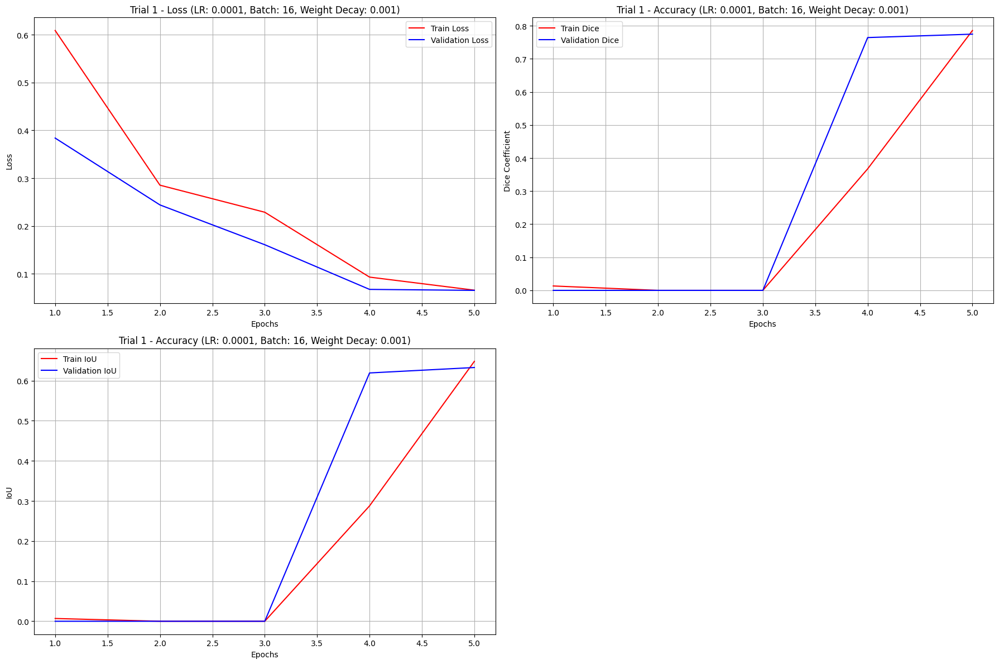



Trial 2/10 --> learning rate = 0.01, batch_size = 64, weight_decay = 0.001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:27,  3.89s/batch]

Training Loss: 0.7199


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.83s/batch]

Training Loss: 0.3241


Epoch 1 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.83s/batch]

Training Loss: 0.6937


Epoch 1 Training:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Training Loss: 0.6279


Epoch 1 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.78s/batch]

Training Loss: 0.2975


Epoch 1 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Training Loss: 7.3543


Epoch 1 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.77s/batch]

Training Loss: 0.6205


Epoch 1 Training: 100%|██████████| 8/8 [00:30<00:00,  3.77s/batch]


Training Loss: 0.2799




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.68s/batch]

Validation Loss: 0.1622


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.69s/batch]

Validation Loss: 0.1677


Epoch 1 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.04s/batch]


Validation Loss: 0.1596
Epoch 1, Validation Loss: 0.1644, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.79s/batch]

Training Loss: 0.1698


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.76s/batch]

Training Loss: 0.2395


Epoch 2 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Training Loss: 2.4829


Epoch 2 Training:  50%|█████     | 4/8 [00:15<00:15,  3.78s/batch]

Training Loss: 0.1323


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.75s/batch]

Training Loss: 0.1242


Epoch 2 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.75s/batch]

Training Loss: 0.3667


Epoch 2 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.75s/batch]

Training Loss: 107.1357


Epoch 2 Training: 100%|██████████| 8/8 [00:29<00:00,  3.73s/batch]


Training Loss: 7.1500




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.65s/batch]

Validation Loss: 57.7364


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.66s/batch]

Validation Loss: 66.7519


Epoch 2 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.02s/batch]


Validation Loss: 56.4648
Epoch 2, Validation Loss: 61.5666, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.73s/batch]

Training Loss: 102.5060


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.72s/batch]

Training Loss: 59.2685


Epoch 3 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.73s/batch]

Training Loss: 0.2685


Epoch 3 Training:  50%|█████     | 4/8 [00:14<00:14,  3.75s/batch]

Training Loss: 0.4873


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Training Loss: 753.6625


Epoch 3 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Training Loss: 881.9365


Epoch 3 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.74s/batch]

Training Loss: 10866.7461


Epoch 3 Training: 100%|██████████| 8/8 [00:29<00:00,  3.72s/batch]


Training Loss: 23711.2207




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.66s/batch]

Validation Loss: 3047.0757


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.67s/batch]

Validation Loss: 3028.2351


Epoch 3 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.02s/batch]


Validation Loss: 3040.6936
Epoch 3, Validation Loss: 3038.0116, Validation Dice: 0.0958, Validation IoU: 0.0503




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Training Loss: 2989.7917


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.73s/batch]

Training Loss: 41892.2266


Epoch 4 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.75s/batch]

Training Loss: 668.7555


Epoch 4 Training:  50%|█████     | 4/8 [00:15<00:15,  3.78s/batch]

Training Loss: 182.2340


Epoch 4 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.75s/batch]

Training Loss: 13470.8613


Epoch 4 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.75s/batch]

Training Loss: 249.0883


Epoch 4 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Training Loss: 39.3154


Epoch 4 Training: 100%|██████████| 8/8 [00:29<00:00,  3.73s/batch]


Training Loss: 11.7241




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.65s/batch]

Validation Loss: 987.6344


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.65s/batch]

Validation Loss: 1065.1218


Epoch 4 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.02s/batch]


Validation Loss: 974.8704
Epoch 4, Validation Loss: 1020.3393, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Training Loss: 1290.9364


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.74s/batch]

Training Loss: 451.1327


Epoch 5 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.75s/batch]

Training Loss: 1610.0562


Epoch 5 Training:  50%|█████     | 4/8 [00:14<00:14,  3.74s/batch]

Training Loss: 298.6082


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.75s/batch]

Training Loss: 913.8414


Epoch 5 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.76s/batch]

Training Loss: 4423.3218


Epoch 5 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Training Loss: 475.7438


Epoch 5 Training: 100%|██████████| 8/8 [00:29<00:00,  3.73s/batch]


Training Loss: 12021.0156




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.67s/batch]

Validation Loss: 7.9764


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.66s/batch]

Validation Loss: 8.6119


Epoch 5 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.01s/batch]


Validation Loss: 7.8672
Epoch 5, Validation Loss: 8.2441, Validation Dice: 0.0000, Validation IoU: 0.0000




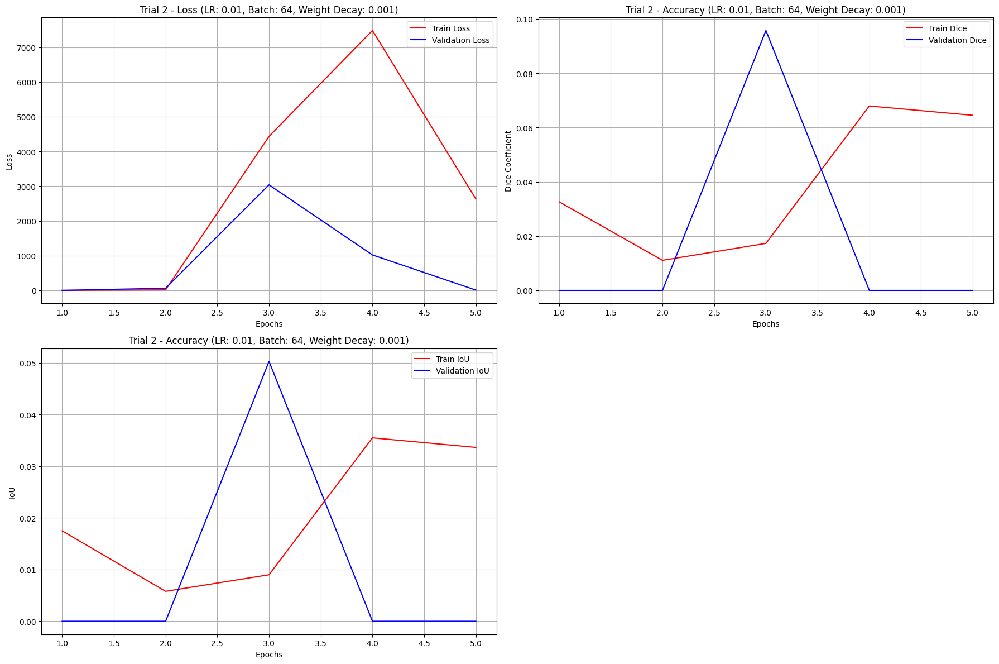



Trial 3/10 --> learning rate = 0.01, batch_size = 32, weight_decay = 0.001


Epoch 1 Training:   6%|▋         | 1/16 [00:01<00:28,  1.91s/batch]

Training Loss: 0.7405


Epoch 1 Training:  12%|█▎        | 2/16 [00:03<00:26,  1.89s/batch]

Training Loss: 0.4130


Epoch 1 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.88s/batch]

Training Loss: 0.5497


Epoch 1 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.87s/batch]

Training Loss: 0.3609


Epoch 1 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.86s/batch]

Training Loss: 206.5671


Epoch 1 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.87s/batch]

Training Loss: 0.1664


Epoch 1 Training:  44%|████▍     | 7/16 [00:13<00:16,  1.87s/batch]

Training Loss: 8.6236


Epoch 1 Training:  50%|█████     | 8/16 [00:14<00:14,  1.87s/batch]

Training Loss: 0.1668


Epoch 1 Training:  56%|█████▋    | 9/16 [00:16<00:13,  1.87s/batch]

Training Loss: 0.2662


Epoch 1 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.87s/batch]

Training Loss: 2.3676


Epoch 1 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.86s/batch]

Training Loss: 59.5086


Epoch 1 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.86s/batch]

Training Loss: 19.0598


Epoch 1 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.86s/batch]

Training Loss: 7.3637


Epoch 1 Training:  88%|████████▊ | 14/16 [00:26<00:03,  1.87s/batch]

Training Loss: 1.7600


Epoch 1 Training:  94%|█████████▍| 15/16 [00:28<00:01,  1.87s/batch]

Training Loss: 7158.7041


Epoch 1 Training: 100%|██████████| 16/16 [00:29<00:00,  1.86s/batch]


Training Loss: 5.9834




Epoch 1 Validation:  20%|██        | 1/5 [00:01<00:05,  1.34s/batch]

Validation Loss: 127.3255


Epoch 1 Validation:  40%|████      | 2/5 [00:02<00:04,  1.34s/batch]

Validation Loss: 158.7091


Epoch 1 Validation:  60%|██████    | 3/5 [00:03<00:02,  1.33s/batch]

Validation Loss: 151.9805


Epoch 1 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.33s/batch]

Validation Loss: 156.9355


Epoch 1 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.21s/batch]


Validation Loss: 141.1138
Epoch 1, Validation Loss: 147.8438, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:   6%|▋         | 1/16 [00:01<00:28,  1.87s/batch]

Training Loss: 268.9854


Epoch 2 Training:  12%|█▎        | 2/16 [00:03<00:26,  1.87s/batch]

Training Loss: 2.3227


Epoch 2 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.85s/batch]

Training Loss: 61128.9180


Epoch 2 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.87s/batch]

Training Loss: 53966.5625


Epoch 2 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.87s/batch]

Training Loss: 1755731.2500


Epoch 2 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.86s/batch]

Training Loss: 7565.8130


Epoch 2 Training:  44%|████▍     | 7/16 [00:13<00:16,  1.86s/batch]

Training Loss: 152436.2500


Epoch 2 Training:  50%|█████     | 8/16 [00:14<00:14,  1.87s/batch]

Training Loss: 5937.1982


Epoch 2 Training:  56%|█████▋    | 9/16 [00:16<00:13,  1.86s/batch]

Training Loss: 8070.6509


Epoch 2 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.86s/batch]

Training Loss: 6647.1279


Epoch 2 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.86s/batch]

Training Loss: 75.1949


Epoch 2 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.86s/batch]

Training Loss: 10509.7461


Epoch 2 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.86s/batch]

Training Loss: 194158.6562


Epoch 2 Training:  88%|████████▊ | 14/16 [00:26<00:03,  1.86s/batch]

Training Loss: 1474.1672


Epoch 2 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.86s/batch]

Training Loss: 220.4197


Epoch 2 Training: 100%|██████████| 16/16 [00:29<00:00,  1.85s/batch]


Training Loss: 0.6724




Epoch 2 Validation:  20%|██        | 1/5 [00:01<00:05,  1.34s/batch]

Validation Loss: 0.6681


Epoch 2 Validation:  40%|████      | 2/5 [00:02<00:04,  1.34s/batch]

Validation Loss: 0.6687


Epoch 2 Validation:  60%|██████    | 3/5 [00:04<00:02,  1.33s/batch]

Validation Loss: 0.6685


Epoch 2 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.33s/batch]

Validation Loss: 0.6686


Epoch 2 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.21s/batch]


Validation Loss: 0.6684
Epoch 2, Validation Loss: 0.6685, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:   6%|▋         | 1/16 [00:01<00:27,  1.82s/batch]

Training Loss: 0.6685


Epoch 3 Training:  12%|█▎        | 2/16 [00:03<00:25,  1.85s/batch]

Training Loss: 0.6631


Epoch 3 Training:  19%|█▉        | 3/16 [00:05<00:23,  1.84s/batch]

Training Loss: 0.6555


Epoch 3 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.85s/batch]

Training Loss: 0.6449


Epoch 3 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.84s/batch]

Training Loss: 0.6334


Epoch 3 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.84s/batch]

Training Loss: 0.6200


Epoch 3 Training:  44%|████▍     | 7/16 [00:12<00:16,  1.85s/batch]

Training Loss: 0.6056


Epoch 3 Training:  50%|█████     | 8/16 [00:14<00:14,  1.84s/batch]

Training Loss: 0.5890


Epoch 3 Training:  56%|█████▋    | 9/16 [00:16<00:12,  1.85s/batch]

Training Loss: 0.5731


Epoch 3 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.85s/batch]

Training Loss: 0.5544


Epoch 3 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.86s/batch]

Training Loss: 0.5343


Epoch 3 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.85s/batch]

Training Loss: 0.5140


Epoch 3 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.85s/batch]

Training Loss: 0.4903


Epoch 3 Training:  88%|████████▊ | 14/16 [00:25<00:03,  1.85s/batch]

Training Loss: 0.4683


Epoch 3 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.85s/batch]

Training Loss: 0.4402


Epoch 3 Training: 100%|██████████| 16/16 [00:29<00:00,  1.84s/batch]


Training Loss: 0.4212




Epoch 3 Validation:  20%|██        | 1/5 [00:01<00:05,  1.35s/batch]

Validation Loss: 0.3833


Epoch 3 Validation:  40%|████      | 2/5 [00:02<00:04,  1.37s/batch]

Validation Loss: 0.3926


Epoch 3 Validation:  60%|██████    | 3/5 [00:04<00:02,  1.35s/batch]

Validation Loss: 0.3902


Epoch 3 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.34s/batch]

Validation Loss: 0.3920


Epoch 3 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.22s/batch]


Validation Loss: 0.3876
Epoch 3, Validation Loss: 0.3893, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 4 Training:   6%|▋         | 1/16 [00:01<00:27,  1.83s/batch]

Training Loss: 0.3890


Epoch 4 Training:  12%|█▎        | 2/16 [00:03<00:26,  1.86s/batch]

Training Loss: 59.9326


Epoch 4 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.88s/batch]

Training Loss: 0.3549


Epoch 4 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.88s/batch]

Training Loss: 0.3706


Epoch 4 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.87s/batch]

Training Loss: 460.9568


Epoch 4 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.87s/batch]

Training Loss: 0.4242


Epoch 4 Training:  44%|████▍     | 7/16 [00:13<00:16,  1.86s/batch]

Training Loss: 0.2727


Epoch 4 Training:  50%|█████     | 8/16 [00:14<00:14,  1.87s/batch]

Training Loss: 0.3040


Epoch 4 Training:  56%|█████▋    | 9/16 [00:16<00:13,  1.88s/batch]

Training Loss: 232.1191


Epoch 4 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.87s/batch]

Training Loss: 0.2360


Epoch 4 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.86s/batch]

Training Loss: 0.2322


Epoch 4 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.86s/batch]

Training Loss: 0.2320


Epoch 4 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.85s/batch]

Training Loss: 0.2345


Epoch 4 Training:  88%|████████▊ | 14/16 [00:26<00:03,  1.85s/batch]

Training Loss: 0.2227


Epoch 4 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.86s/batch]

Training Loss: 0.2293


Epoch 4 Training: 100%|██████████| 16/16 [00:29<00:00,  1.85s/batch]


Training Loss: 0.2064




Epoch 4 Validation:  20%|██        | 1/5 [00:01<00:05,  1.34s/batch]

Validation Loss: 0.1882


Epoch 4 Validation:  40%|████      | 2/5 [00:02<00:04,  1.37s/batch]

Validation Loss: 0.2144


Epoch 4 Validation:  60%|██████    | 3/5 [00:04<00:02,  1.39s/batch]

Validation Loss: 0.2076


Epoch 4 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.38s/batch]

Validation Loss: 0.2126


Epoch 4 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.24s/batch]


Validation Loss: 0.2003
Epoch 4, Validation Loss: 0.2051, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:   6%|▋         | 1/16 [00:01<00:27,  1.84s/batch]

Training Loss: 0.2021


Epoch 5 Training:  12%|█▎        | 2/16 [00:03<00:25,  1.85s/batch]

Training Loss: 0.2247


Epoch 5 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.86s/batch]

Training Loss: 0.1993


Epoch 5 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.86s/batch]

Training Loss: 0.2105


Epoch 5 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.86s/batch]

Training Loss: 7.5130


Epoch 5 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.86s/batch]

Training Loss: 134.8526


Epoch 5 Training:  44%|████▍     | 7/16 [00:12<00:16,  1.85s/batch]

Training Loss: 0.2036


Epoch 5 Training:  50%|█████     | 8/16 [00:14<00:14,  1.85s/batch]

Training Loss: 0.2006


Epoch 5 Training:  56%|█████▋    | 9/16 [00:16<00:13,  1.86s/batch]

Training Loss: 1572883.8750


Epoch 5 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.88s/batch]

Training Loss: 75.5741


Epoch 5 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.88s/batch]

Training Loss: 34.9143


Epoch 5 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.89s/batch]

Training Loss: 1759.6396


Epoch 5 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.87s/batch]

Training Loss: 0.2297


Epoch 5 Training:  88%|████████▊ | 14/16 [00:26<00:03,  1.86s/batch]

Training Loss: 0.2061


Epoch 5 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.85s/batch]

Training Loss: 0.2297


Epoch 5 Training: 100%|██████████| 16/16 [00:29<00:00,  1.85s/batch]


Training Loss: 0.2362




Epoch 5 Validation:  20%|██        | 1/5 [00:01<00:05,  1.33s/batch]

Validation Loss: 0.1798


Epoch 5 Validation:  40%|████      | 2/5 [00:02<00:04,  1.34s/batch]

Validation Loss: 0.2146


Epoch 5 Validation:  60%|██████    | 3/5 [00:04<00:02,  1.33s/batch]

Validation Loss: 0.2055


Epoch 5 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.33s/batch]

Validation Loss: 0.2122


Epoch 5 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.21s/batch]


Validation Loss: 0.1959
Epoch 5, Validation Loss: 0.2022, Validation Dice: 0.0000, Validation IoU: 0.0000




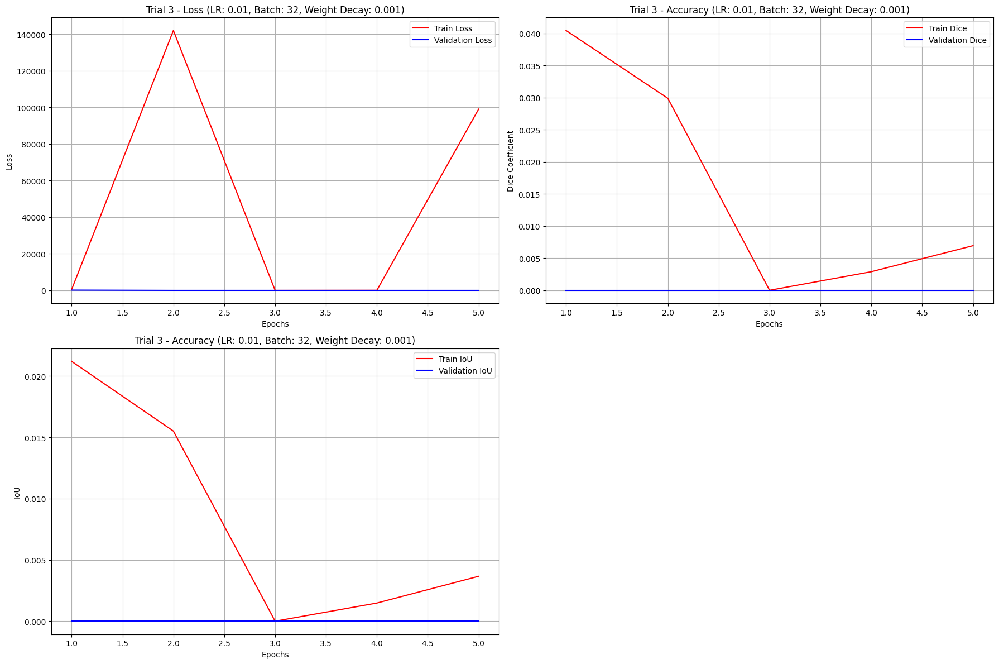



Trial 4/10 --> learning rate = 0.001, batch_size = 64, weight_decay = 0.001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Training Loss: 0.7111


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.82s/batch]

Training Loss: 0.6811


Epoch 1 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Training Loss: 0.6447


Epoch 1 Training:  50%|█████     | 4/8 [00:15<00:15,  3.81s/batch]

Training Loss: 0.5846


Epoch 1 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.82s/batch]

Training Loss: 0.4931


Epoch 1 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.80s/batch]

Training Loss: 0.3697


Epoch 1 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.80s/batch]

Training Loss: 0.2816


Epoch 1 Training: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Training Loss: 0.3880




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.71s/batch]

Validation Loss: 0.3191


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.68s/batch]

Validation Loss: 0.3459


Epoch 1 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.03s/batch]


Validation Loss: 0.3193
Epoch 1, Validation Loss: 0.3310, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.80s/batch]

Training Loss: 0.3498


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:23,  3.83s/batch]

Training Loss: 0.3030


Epoch 2 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.84s/batch]

Training Loss: 0.2901


Epoch 2 Training:  50%|█████     | 4/8 [00:15<00:15,  3.81s/batch]

Training Loss: 0.2604


Epoch 2 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.83s/batch]

Training Loss: 0.2443


Epoch 2 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.81s/batch]

Training Loss: 0.2378


Epoch 2 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.80s/batch]

Training Loss: 0.2321


Epoch 2 Training: 100%|██████████| 8/8 [00:30<00:00,  3.79s/batch]


Training Loss: 0.2310




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.71s/batch]

Validation Loss: 0.2079


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.69s/batch]

Validation Loss: 0.2145


Epoch 2 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.04s/batch]


Validation Loss: 0.2048
Epoch 2, Validation Loss: 0.2105, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Training Loss: 0.2176


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.79s/batch]

Training Loss: 0.2154


Epoch 3 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.80s/batch]

Training Loss: 0.1841


Epoch 3 Training:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Training Loss: 0.1807


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.79s/batch]

Training Loss: 0.1568


Epoch 3 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.78s/batch]

Training Loss: 0.1456


Epoch 3 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.79s/batch]

Training Loss: 0.1203


Epoch 3 Training: 100%|██████████| 8/8 [00:30<00:00,  3.77s/batch]


Training Loss: 0.1019




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.69s/batch]

Validation Loss: 0.0924


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.71s/batch]

Validation Loss: 0.0947


Epoch 3 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.04s/batch]


Validation Loss: 0.0895
Epoch 3, Validation Loss: 0.0931, Validation Dice: 0.4436, Validation IoU: 0.2851




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.80s/batch]

Training Loss: 0.0971


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.82s/batch]

Training Loss: 0.0881


Epoch 4 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.80s/batch]

Training Loss: 0.0780


Epoch 4 Training:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Training Loss: 0.0744


Epoch 4 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.81s/batch]

Training Loss: 0.0783


Epoch 4 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.81s/batch]

Training Loss: 0.0661


Epoch 4 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.80s/batch]

Training Loss: 0.0707


Epoch 4 Training: 100%|██████████| 8/8 [00:30<00:00,  3.79s/batch]


Training Loss: 0.0662




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.67s/batch]

Validation Loss: 0.0630


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.69s/batch]

Validation Loss: 0.0636


Epoch 4 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.04s/batch]


Validation Loss: 0.0573
Epoch 4, Validation Loss: 0.0626, Validation Dice: 0.7926, Validation IoU: 0.6565




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.78s/batch]

Training Loss: 0.0627


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.80s/batch]

Training Loss: 0.0621


Epoch 5 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.80s/batch]

Training Loss: 0.0615


Epoch 5 Training:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Training Loss: 0.0605


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.78s/batch]

Training Loss: 0.0581


Epoch 5 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.79s/batch]

Training Loss: 0.0628


Epoch 5 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.80s/batch]

Training Loss: 0.0571


Epoch 5 Training: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Training Loss: 0.0595




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.68s/batch]

Validation Loss: 0.0612


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.68s/batch]

Validation Loss: 0.0608


Epoch 5 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.03s/batch]


Validation Loss: 0.0539
Epoch 5, Validation Loss: 0.0602, Validation Dice: 0.7851, Validation IoU: 0.6463




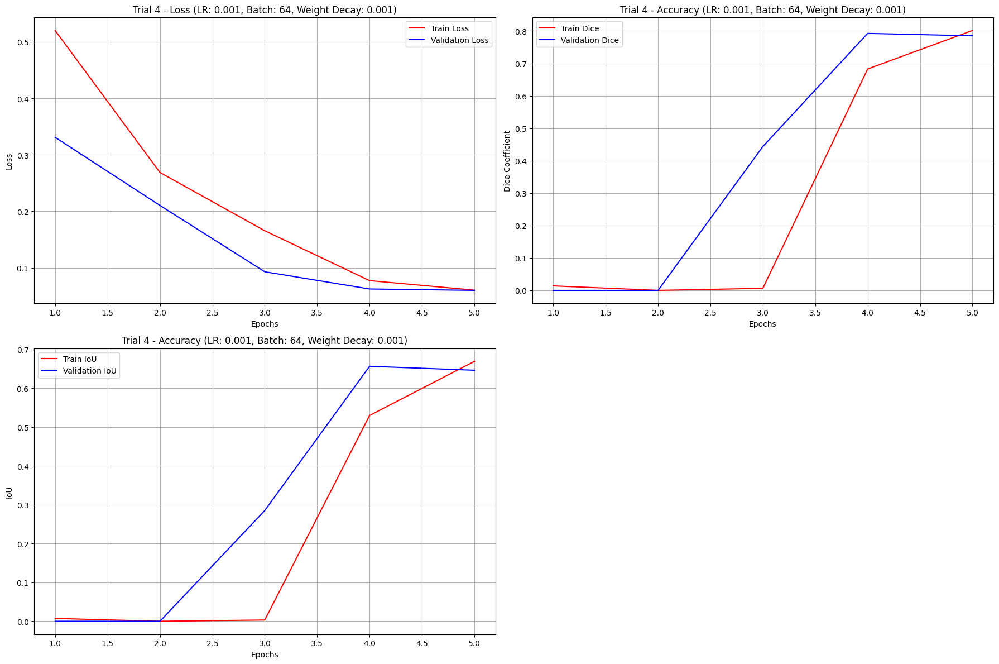



Trial 5/10 --> learning rate = 0.0001, batch_size = 64, weight_decay = 0.0001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Training Loss: 0.6899


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.81s/batch]

Training Loss: 0.6872


Epoch 1 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.79s/batch]

Training Loss: 0.6846


Epoch 1 Training:  50%|█████     | 4/8 [00:15<00:15,  3.80s/batch]

Training Loss: 0.6819


Epoch 1 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.83s/batch]

Training Loss: 0.6795


Epoch 1 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.83s/batch]

Training Loss: 0.6774


Epoch 1 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.83s/batch]

Training Loss: 0.6740


Epoch 1 Training: 100%|██████████| 8/8 [00:30<00:00,  3.80s/batch]


Training Loss: 0.6715




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.68s/batch]

Validation Loss: 0.6685


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.68s/batch]

Validation Loss: 0.6685


Epoch 1 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.02s/batch]


Validation Loss: 0.6681
Epoch 1, Validation Loss: 0.6685, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.80s/batch]

Training Loss: 0.6684


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.80s/batch]

Training Loss: 0.6659


Epoch 2 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.80s/batch]

Training Loss: 0.6629


Epoch 2 Training:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Training Loss: 0.6585


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.80s/batch]

Training Loss: 0.6536


Epoch 2 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.81s/batch]

Training Loss: 0.6470


Epoch 2 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.80s/batch]

Training Loss: 0.6423


Epoch 2 Training: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Training Loss: 0.6370




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.69s/batch]

Validation Loss: 0.6289


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.68s/batch]

Validation Loss: 0.6289


Epoch 2 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.03s/batch]


Validation Loss: 0.6276
Epoch 2, Validation Loss: 0.6288, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.78s/batch]

Training Loss: 0.6279


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.79s/batch]

Training Loss: 0.6186


Epoch 3 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.78s/batch]

Training Loss: 0.6077


Epoch 3 Training:  50%|█████     | 4/8 [00:15<00:15,  3.79s/batch]

Training Loss: 0.5999


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.80s/batch]

Training Loss: 0.5802


Epoch 3 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.80s/batch]

Training Loss: 0.5664


Epoch 3 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.80s/batch]

Training Loss: 0.5516


Epoch 3 Training: 100%|██████████| 8/8 [00:30<00:00,  3.77s/batch]


Training Loss: 0.5246




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.71s/batch]

Validation Loss: 0.5035


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.72s/batch]

Validation Loss: 0.5040


Epoch 3 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.05s/batch]


Validation Loss: 0.4997
Epoch 3, Validation Loss: 0.5033, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Training Loss: 0.4956


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.81s/batch]

Training Loss: 0.4660


Epoch 4 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Training Loss: 0.4339


Epoch 4 Training:  50%|█████     | 4/8 [00:15<00:15,  3.81s/batch]

Training Loss: 0.3819


Epoch 4 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.81s/batch]

Training Loss: 0.3373


Epoch 4 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.81s/batch]

Training Loss: 0.3185


Epoch 4 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.82s/batch]

Training Loss: 0.2665


Epoch 4 Training: 100%|██████████| 8/8 [00:30<00:00,  3.79s/batch]


Training Loss: 0.2895




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.67s/batch]

Validation Loss: 0.2595


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.67s/batch]

Validation Loss: 0.2767


Epoch 4 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.03s/batch]


Validation Loss: 0.2575
Epoch 4, Validation Loss: 0.2668, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.81s/batch]

Training Loss: 0.3262


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:23,  3.84s/batch]

Training Loss: 0.3115


Epoch 5 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.82s/batch]

Training Loss: 0.3320


Epoch 5 Training:  50%|█████     | 4/8 [00:15<00:15,  3.80s/batch]

Training Loss: 0.2869


Epoch 5 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.82s/batch]

Training Loss: 0.2899


Epoch 5 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.82s/batch]

Training Loss: 0.2820


Epoch 5 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.82s/batch]

Training Loss: 0.2743


Epoch 5 Training: 100%|██████████| 8/8 [00:30<00:00,  3.80s/batch]


Training Loss: 0.2410




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.71s/batch]

Validation Loss: 0.2575


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.71s/batch]

Validation Loss: 0.2665


Epoch 5 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.05s/batch]


Validation Loss: 0.2533
Epoch 5, Validation Loss: 0.2610, Validation Dice: 0.0000, Validation IoU: 0.0000




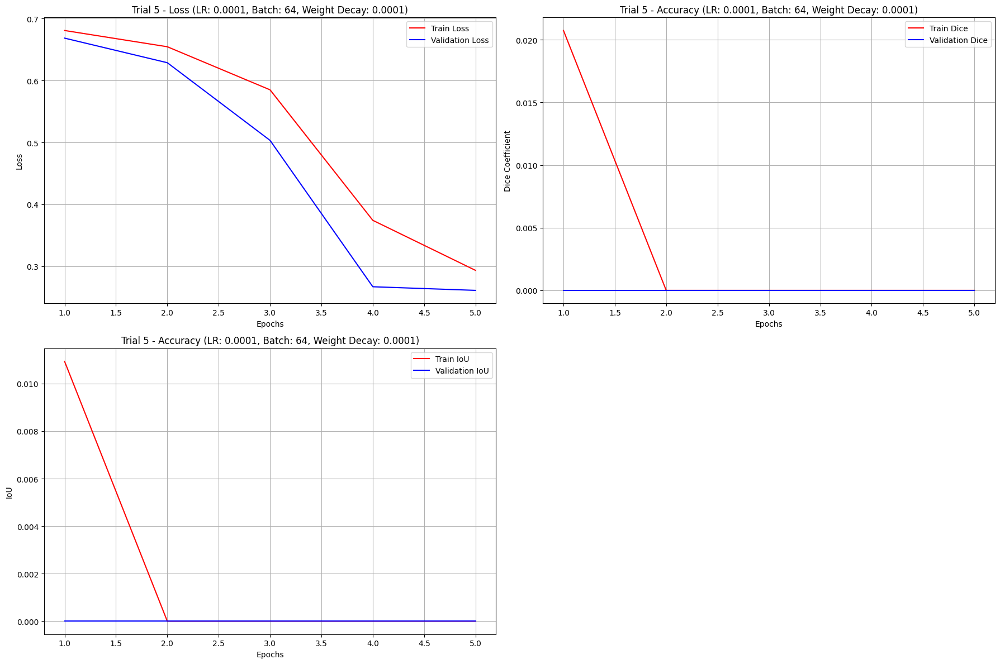



Trial 6/10 --> learning rate = 0.001, batch_size = 16, weight_decay = 0.0001


Epoch 1 Training:   3%|▎         | 1/32 [00:00<00:29,  1.05batch/s]

Training Loss: 0.6780


Epoch 1 Training:   6%|▋         | 2/32 [00:01<00:28,  1.05batch/s]

Training Loss: 0.6230


Epoch 1 Training:   9%|▉         | 3/32 [00:02<00:27,  1.04batch/s]

Training Loss: 0.5207


Epoch 1 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.04batch/s]

Training Loss: 0.3776


Epoch 1 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.05batch/s]

Training Loss: 0.2366


Epoch 1 Training:  19%|█▉        | 6/32 [00:05<00:25,  1.03batch/s]

Training Loss: 0.4229


Epoch 1 Training:  22%|██▏       | 7/32 [00:06<00:24,  1.04batch/s]

Training Loss: 0.3547


Epoch 1 Training:  25%|██▌       | 8/32 [00:07<00:23,  1.04batch/s]

Training Loss: 0.3277


Epoch 1 Training:  28%|██▊       | 9/32 [00:08<00:22,  1.04batch/s]

Training Loss: 0.2898


Epoch 1 Training:  31%|███▏      | 10/32 [00:09<00:21,  1.04batch/s]

Training Loss: 0.2480


Epoch 1 Training:  34%|███▍      | 11/32 [00:10<00:20,  1.04batch/s]

Training Loss: 0.2474


Epoch 1 Training:  38%|███▊      | 12/32 [00:11<00:19,  1.04batch/s]

Training Loss: 0.2532


Epoch 1 Training:  41%|████      | 13/32 [00:12<00:18,  1.05batch/s]

Training Loss: 0.2237


Epoch 1 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.04batch/s]

Training Loss: 0.2332


Epoch 1 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.05batch/s]

Training Loss: 0.2393


Epoch 1 Training:  50%|█████     | 16/32 [00:15<00:15,  1.05batch/s]

Training Loss: 0.1950


Epoch 1 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.04batch/s]

Training Loss: 0.1830


Epoch 1 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.04batch/s]

Training Loss: 0.1516


Epoch 1 Training:  59%|█████▉    | 19/32 [00:18<00:12,  1.04batch/s]

Training Loss: 0.1674


Epoch 1 Training:  62%|██████▎   | 20/32 [00:19<00:11,  1.04batch/s]

Training Loss: 0.1533


Epoch 1 Training:  66%|██████▌   | 21/32 [00:20<00:10,  1.03batch/s]

Training Loss: 0.1130


Epoch 1 Training:  69%|██████▉   | 22/32 [00:21<00:09,  1.04batch/s]

Training Loss: 0.1165


Epoch 1 Training:  72%|███████▏  | 23/32 [00:22<00:08,  1.04batch/s]

Training Loss: 0.1183


Epoch 1 Training:  75%|███████▌  | 24/32 [00:23<00:07,  1.05batch/s]

Training Loss: 0.1037


Epoch 1 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.04batch/s]

Training Loss: 0.0976


Epoch 1 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.05batch/s]

Training Loss: 0.0924


Epoch 1 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.05batch/s]

Training Loss: 0.0966


Epoch 1 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.05batch/s]

Training Loss: 0.0851


Epoch 1 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.05batch/s]

Training Loss: 0.0794


Epoch 1 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.04batch/s]

Training Loss: 0.0708


Epoch 1 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.04batch/s]

Training Loss: 0.0709


Epoch 1 Training: 100%|██████████| 32/32 [00:30<00:00,  1.05batch/s]


Training Loss: 0.0775




Epoch 1 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0676


Epoch 1 Validation:  20%|██        | 2/10 [00:01<00:05,  1.47batch/s]

Validation Loss: 0.0741


Epoch 1 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0771


Epoch 1 Validation:  40%|████      | 4/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0813


Epoch 1 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.48batch/s]

Validation Loss: 0.0686


Epoch 1 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0730


Epoch 1 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.0678


Epoch 1 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.50batch/s]

Validation Loss: 0.0882


Epoch 1 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0666
Validation Loss: 0.0774
Epoch 1, Validation Loss: 0.0738, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:29,  1.07batch/s]

Training Loss: 0.0711


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:28,  1.05batch/s]

Training Loss: 0.0692


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.0820


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 0.0694


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.05batch/s]

Training Loss: 0.0851


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.05batch/s]

Training Loss: 0.0922


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.05batch/s]

Training Loss: 0.0764


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 0.0702


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.05batch/s]

Training Loss: 0.0677


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.0639


Epoch 2 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.06batch/s]

Training Loss: 0.0763


Epoch 2 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.06batch/s]

Training Loss: 0.0751


Epoch 2 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.0721


Epoch 2 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.06batch/s]

Training Loss: 0.0711


Epoch 2 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 0.0696


Epoch 2 Training:  50%|█████     | 16/32 [00:15<00:15,  1.05batch/s]

Training Loss: 0.0631


Epoch 2 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.05batch/s]

Training Loss: 0.0809


Epoch 2 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.05batch/s]

Training Loss: 0.0724


Epoch 2 Training:  59%|█████▉    | 19/32 [00:18<00:12,  1.05batch/s]

Training Loss: 0.0748


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.05batch/s]

Training Loss: 0.0653


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.05batch/s]

Training Loss: 0.0526


Epoch 2 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.04batch/s]

Training Loss: 0.0682


Epoch 2 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.05batch/s]

Training Loss: 0.0667


Epoch 2 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.04batch/s]

Training Loss: 0.0524


Epoch 2 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.05batch/s]

Training Loss: 0.0722


Epoch 2 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.05batch/s]

Training Loss: 0.0897


Epoch 2 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.05batch/s]

Training Loss: 0.0604


Epoch 2 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.05batch/s]

Training Loss: 0.0623


Epoch 2 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.05batch/s]

Training Loss: 0.0579


Epoch 2 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.04batch/s]

Training Loss: 0.0687


Epoch 2 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.04batch/s]

Training Loss: 0.0637


Epoch 2 Training: 100%|██████████| 32/32 [00:30<00:00,  1.06batch/s]


Training Loss: 0.0694




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:06,  1.49batch/s]

Validation Loss: 0.0460


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.51batch/s]

Validation Loss: 0.0545


Epoch 2 Validation:  30%|███       | 3/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0590


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0602


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0526


Epoch 2 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0528


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0475


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.0642


Epoch 2 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0492
Validation Loss: 0.0528
Epoch 2, Validation Loss: 0.0540, Validation Dice: 0.8038, Validation IoU: 0.6723




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:29,  1.05batch/s]

Training Loss: 0.0542


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:28,  1.06batch/s]

Training Loss: 0.0649


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:27,  1.05batch/s]

Training Loss: 0.0460


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.05batch/s]

Training Loss: 0.0395


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.05batch/s]

Training Loss: 0.0473


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:25,  1.04batch/s]

Training Loss: 0.0479


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:24,  1.04batch/s]

Training Loss: 0.0644


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:23,  1.03batch/s]

Training Loss: 0.0374


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:22,  1.04batch/s]

Training Loss: 0.0684


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:21,  1.04batch/s]

Training Loss: 0.0510


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:20,  1.04batch/s]

Training Loss: 0.0498


Epoch 3 Training:  38%|███▊      | 12/32 [00:11<00:19,  1.04batch/s]

Training Loss: 0.0742


Epoch 3 Training:  41%|████      | 13/32 [00:12<00:18,  1.04batch/s]

Training Loss: 0.0398


Epoch 3 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.05batch/s]

Training Loss: 0.0411


Epoch 3 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.05batch/s]

Training Loss: 0.0391


Epoch 3 Training:  50%|█████     | 16/32 [00:15<00:15,  1.05batch/s]

Training Loss: 0.0496


Epoch 3 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.04batch/s]

Training Loss: 0.0431


Epoch 3 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.05batch/s]

Training Loss: 0.0503


Epoch 3 Training:  59%|█████▉    | 19/32 [00:18<00:12,  1.05batch/s]

Training Loss: 0.0481


Epoch 3 Training:  62%|██████▎   | 20/32 [00:19<00:11,  1.05batch/s]

Training Loss: 0.0560


Epoch 3 Training:  66%|██████▌   | 21/32 [00:20<00:10,  1.05batch/s]

Training Loss: 0.0549


Epoch 3 Training:  69%|██████▉   | 22/32 [00:21<00:09,  1.05batch/s]

Training Loss: 0.0372


Epoch 3 Training:  72%|███████▏  | 23/32 [00:22<00:08,  1.05batch/s]

Training Loss: 0.0446


Epoch 3 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.0420


Epoch 3 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.05batch/s]

Training Loss: 0.0384


Epoch 3 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.05batch/s]

Training Loss: 0.0411


Epoch 3 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.05batch/s]

Training Loss: 0.0489


Epoch 3 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.04batch/s]

Training Loss: 0.0559


Epoch 3 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.04batch/s]

Training Loss: 0.0483


Epoch 3 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.04batch/s]

Training Loss: 0.0434


Epoch 3 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.04batch/s]

Training Loss: 0.0413


Epoch 3 Training: 100%|██████████| 32/32 [00:30<00:00,  1.05batch/s]


Training Loss: 0.0404




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:05,  1.52batch/s]

Validation Loss: 0.0352


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.52batch/s]

Validation Loss: 0.0425


Epoch 3 Validation:  30%|███       | 3/10 [00:02<00:04,  1.48batch/s]

Validation Loss: 0.0436


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0462


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.47batch/s]

Validation Loss: 0.0378


Epoch 3 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0391


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.47batch/s]

Validation Loss: 0.0373


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0480


Epoch 3 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 0.0384
Validation Loss: 0.0394
Epoch 3, Validation Loss: 0.0409, Validation Dice: 0.8412, Validation IoU: 0.7261




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:29,  1.03batch/s]

Training Loss: 0.0439


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:28,  1.04batch/s]

Training Loss: 0.0375


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:27,  1.05batch/s]

Training Loss: 0.0365


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.05batch/s]

Training Loss: 0.0353


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.04batch/s]

Training Loss: 0.0396


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.05batch/s]

Training Loss: 0.0411


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.05batch/s]

Training Loss: 0.0301


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 0.0375


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.05batch/s]

Training Loss: 0.0406


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.05batch/s]

Training Loss: 0.0407


Epoch 4 Training:  34%|███▍      | 11/32 [00:10<00:20,  1.05batch/s]

Training Loss: 0.0398


Epoch 4 Training:  38%|███▊      | 12/32 [00:11<00:19,  1.05batch/s]

Training Loss: 0.0400


Epoch 4 Training:  41%|████      | 13/32 [00:12<00:18,  1.06batch/s]

Training Loss: 0.0367


Epoch 4 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.05batch/s]

Training Loss: 0.0321


Epoch 4 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 0.0367


Epoch 4 Training:  50%|█████     | 16/32 [00:15<00:15,  1.05batch/s]

Training Loss: 0.0490


Epoch 4 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.05batch/s]

Training Loss: 0.0462


Epoch 4 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.05batch/s]

Training Loss: 0.0444


Epoch 4 Training:  59%|█████▉    | 19/32 [00:18<00:12,  1.05batch/s]

Training Loss: 0.0309


Epoch 4 Training:  62%|██████▎   | 20/32 [00:19<00:11,  1.05batch/s]

Training Loss: 0.0470


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.05batch/s]

Training Loss: 0.0374


Epoch 4 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.05batch/s]

Training Loss: 0.0374


Epoch 4 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.05batch/s]

Training Loss: 0.0368


Epoch 4 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.0495


Epoch 4 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.04batch/s]

Training Loss: 0.0339


Epoch 4 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.05batch/s]

Training Loss: 0.0405


Epoch 4 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.04batch/s]

Training Loss: 0.0480


Epoch 4 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.04batch/s]

Training Loss: 0.0376


Epoch 4 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.05batch/s]

Training Loss: 0.0473


Epoch 4 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.05batch/s]

Training Loss: 0.0456


Epoch 4 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.04batch/s]

Training Loss: 0.0462


Epoch 4 Training: 100%|██████████| 32/32 [00:30<00:00,  1.05batch/s]


Training Loss: 0.0308




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:05,  1.50batch/s]

Validation Loss: 0.0376


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.48batch/s]

Validation Loss: 0.0431


Epoch 4 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0416


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0503


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.0372


Epoch 4 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0399


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.0386


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0469


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0410
Validation Loss: 0.0350
Epoch 4, Validation Loss: 0.0418, Validation Dice: 0.8447, Validation IoU: 0.7314




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:30,  1.03batch/s]

Training Loss: 0.0410


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:28,  1.05batch/s]

Training Loss: 0.0336


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.0494


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.05batch/s]

Training Loss: 0.0579


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.05batch/s]

Training Loss: 0.0392


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.05batch/s]

Training Loss: 0.0543


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.05batch/s]

Training Loss: 0.0422


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 0.0440


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.0377


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:21,  1.05batch/s]

Training Loss: 0.0445


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:20,  1.05batch/s]

Training Loss: 0.0421


Epoch 5 Training:  38%|███▊      | 12/32 [00:11<00:19,  1.05batch/s]

Training Loss: 0.0409


Epoch 5 Training:  41%|████      | 13/32 [00:12<00:18,  1.05batch/s]

Training Loss: 0.0387


Epoch 5 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.06batch/s]

Training Loss: 0.0403


Epoch 5 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.05batch/s]

Training Loss: 0.0439


Epoch 5 Training:  50%|█████     | 16/32 [00:15<00:15,  1.05batch/s]

Training Loss: 0.0569


Epoch 5 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.05batch/s]

Training Loss: 0.0372


Epoch 5 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.05batch/s]

Training Loss: 0.0352


Epoch 5 Training:  59%|█████▉    | 19/32 [00:18<00:12,  1.04batch/s]

Training Loss: 0.0490


Epoch 5 Training:  62%|██████▎   | 20/32 [00:19<00:11,  1.05batch/s]

Training Loss: 0.0397


Epoch 5 Training:  66%|██████▌   | 21/32 [00:20<00:10,  1.05batch/s]

Training Loss: 0.0439


Epoch 5 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.05batch/s]

Training Loss: 0.0446


Epoch 5 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.06batch/s]

Training Loss: 0.0334


Epoch 5 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.0381


Epoch 5 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.05batch/s]

Training Loss: 0.0294


Epoch 5 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.04batch/s]

Training Loss: 0.0385


Epoch 5 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.05batch/s]

Training Loss: 0.0355


Epoch 5 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.04batch/s]

Training Loss: 0.0430


Epoch 5 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.05batch/s]

Training Loss: 0.0283


Epoch 5 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.04batch/s]

Training Loss: 0.0373


Epoch 5 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.04batch/s]

Training Loss: 0.0357


Epoch 5 Training: 100%|██████████| 32/32 [00:30<00:00,  1.05batch/s]


Training Loss: 0.0285




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:06,  1.47batch/s]

Validation Loss: 0.0327


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.49batch/s]

Validation Loss: 0.0377


Epoch 5 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.0378


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:04,  1.50batch/s]

Validation Loss: 0.0434


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 0.0312


Epoch 5 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.0355


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.0357


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.0418


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.0349
Validation Loss: 0.0330
Epoch 5, Validation Loss: 0.0367, Validation Dice: 0.8630, Validation IoU: 0.7592




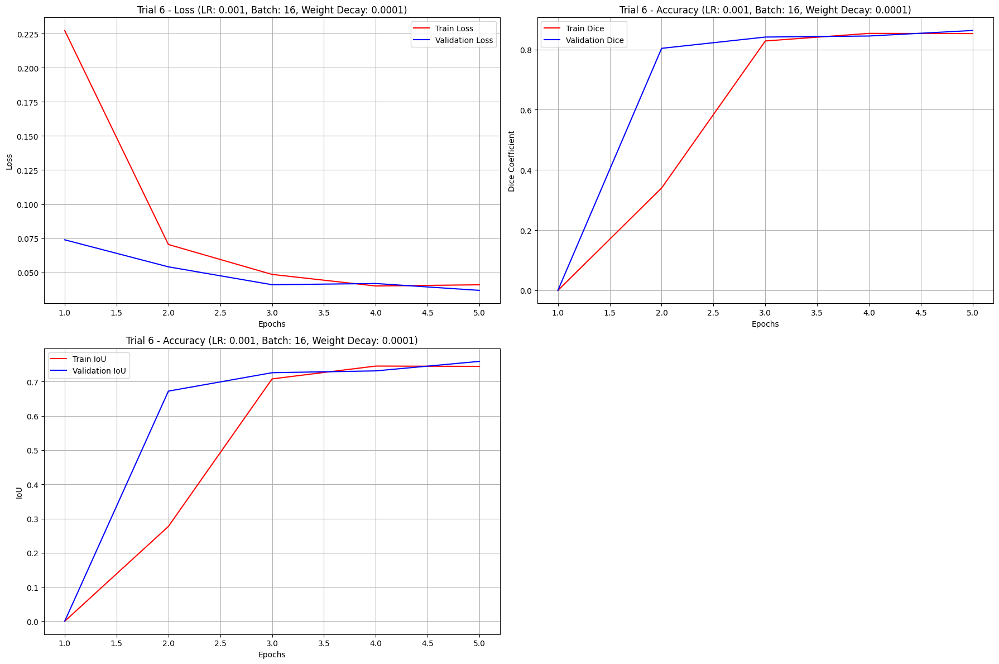



Trial 7/10 --> learning rate = 0.01, batch_size = 32, weight_decay = 0.001


Epoch 1 Training:   6%|▋         | 1/16 [00:01<00:28,  1.89s/batch]

Training Loss: 0.6410


Epoch 1 Training:  12%|█▎        | 2/16 [00:03<00:26,  1.90s/batch]

Training Loss: 0.3995


Epoch 1 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.91s/batch]

Training Loss: 0.5759


Epoch 1 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.91s/batch]

Training Loss: 0.4515


Epoch 1 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.91s/batch]

Training Loss: 0.3507


Epoch 1 Training:  38%|███▊      | 6/16 [00:11<00:19,  1.90s/batch]

Training Loss: 0.2153


Epoch 1 Training:  44%|████▍     | 7/16 [00:13<00:16,  1.89s/batch]

Training Loss: 0.3645


Epoch 1 Training:  50%|█████     | 8/16 [00:15<00:15,  1.88s/batch]

Training Loss: 0.1992


Epoch 1 Training:  56%|█████▋    | 9/16 [00:17<00:13,  1.89s/batch]

Training Loss: 0.2152


Epoch 1 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.89s/batch]

Training Loss: 0.1774


Epoch 1 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.88s/batch]

Training Loss: 1.4785


Epoch 1 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.89s/batch]

Training Loss: 0.1197


Epoch 1 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.88s/batch]

Training Loss: 0.2408


Epoch 1 Training:  88%|████████▊ | 14/16 [00:26<00:03,  1.88s/batch]

Training Loss: 0.3987


Epoch 1 Training:  94%|█████████▍| 15/16 [00:28<00:01,  1.88s/batch]

Training Loss: 672153.2500


Epoch 1 Training: 100%|██████████| 16/16 [00:30<00:00,  1.88s/batch]


Training Loss: 97.7611




Epoch 1 Validation:  20%|██        | 1/5 [00:01<00:05,  1.35s/batch]

Validation Loss: 0.3313


Epoch 1 Validation:  40%|████      | 2/5 [00:02<00:04,  1.36s/batch]

Validation Loss: 0.3588


Epoch 1 Validation:  60%|██████    | 3/5 [00:04<00:02,  1.36s/batch]

Validation Loss: 0.3558


Epoch 1 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.35s/batch]

Validation Loss: 0.3568


Epoch 1 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.23s/batch]


Validation Loss: 0.3447
Epoch 1, Validation Loss: 0.3500, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:   6%|▋         | 1/16 [00:01<00:28,  1.88s/batch]

Training Loss: 0.5355


Epoch 2 Training:  12%|█▎        | 2/16 [00:03<00:26,  1.87s/batch]

Training Loss: 43.0025


Epoch 2 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.87s/batch]

Training Loss: 28.7687


Epoch 2 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.87s/batch]

Training Loss: 23.2568


Epoch 2 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.86s/batch]

Training Loss: 108.1114


Epoch 2 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.86s/batch]

Training Loss: 0.2622


Epoch 2 Training:  44%|████▍     | 7/16 [00:13<00:16,  1.86s/batch]

Training Loss: 100.1763


Epoch 2 Training:  50%|█████     | 8/16 [00:14<00:14,  1.87s/batch]

Training Loss: 39.0856


Epoch 2 Training:  56%|█████▋    | 9/16 [00:16<00:13,  1.87s/batch]

Training Loss: 277.0930


Epoch 2 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.87s/batch]

Training Loss: 357.4698


Epoch 2 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.87s/batch]

Training Loss: 20.7631


Epoch 2 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.88s/batch]

Training Loss: 2654.5483


Epoch 2 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.88s/batch]

Training Loss: 2467.8447


Epoch 2 Training:  88%|████████▊ | 14/16 [00:26<00:03,  1.88s/batch]

Training Loss: 83.1120


Epoch 2 Training:  94%|█████████▍| 15/16 [00:28<00:01,  1.87s/batch]

Training Loss: 1580.5020


Epoch 2 Training: 100%|██████████| 16/16 [00:29<00:00,  1.86s/batch]


Training Loss: 5289.1440




Epoch 2 Validation:  20%|██        | 1/5 [00:01<00:05,  1.33s/batch]

Validation Loss: 69.4835


Epoch 2 Validation:  40%|████      | 2/5 [00:02<00:04,  1.35s/batch]

Validation Loss: 69.0707


Epoch 2 Validation:  60%|██████    | 3/5 [00:04<00:02,  1.34s/batch]

Validation Loss: 68.4442


Epoch 2 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.34s/batch]

Validation Loss: 68.8418


Epoch 2 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.22s/batch]


Validation Loss: 69.3932
Epoch 2, Validation Loss: 69.0108, Validation Dice: 0.0957, Validation IoU: 0.0503




Epoch 3 Training:   6%|▋         | 1/16 [00:01<00:27,  1.85s/batch]

Training Loss: 78.0350


Epoch 3 Training:  12%|█▎        | 2/16 [00:03<00:26,  1.87s/batch]

Training Loss: 52.9748


Epoch 3 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.88s/batch]

Training Loss: 1.2564


Epoch 3 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.88s/batch]

Training Loss: 681.5161


Epoch 3 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.88s/batch]

Training Loss: 528.6875


Epoch 3 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.88s/batch]

Training Loss: 1062.1726


Epoch 3 Training:  44%|████▍     | 7/16 [00:13<00:16,  1.88s/batch]

Training Loss: 47.3086


Epoch 3 Training:  50%|█████     | 8/16 [00:14<00:14,  1.87s/batch]

Training Loss: 74.3975


Epoch 3 Training:  56%|█████▋    | 9/16 [00:16<00:13,  1.87s/batch]

Training Loss: 1.4817


Epoch 3 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.88s/batch]

Training Loss: 0.7252


Epoch 3 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.87s/batch]

Training Loss: 0.3715


Epoch 3 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.86s/batch]

Training Loss: 70.1299


Epoch 3 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.87s/batch]

Training Loss: 30.7574


Epoch 3 Training:  88%|████████▊ | 14/16 [00:26<00:03,  1.87s/batch]

Training Loss: 1.5522


Epoch 3 Training:  94%|█████████▍| 15/16 [00:28<00:01,  1.87s/batch]

Training Loss: 8.7217


Epoch 3 Training: 100%|██████████| 16/16 [00:29<00:00,  1.86s/batch]


Training Loss: 23.8328




Epoch 3 Validation:  20%|██        | 1/5 [00:01<00:05,  1.34s/batch]

Validation Loss: 0.6017


Epoch 3 Validation:  40%|████      | 2/5 [00:02<00:04,  1.34s/batch]

Validation Loss: 0.6039


Epoch 3 Validation:  60%|██████    | 3/5 [00:04<00:02,  1.34s/batch]

Validation Loss: 0.6033


Epoch 3 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.33s/batch]

Validation Loss: 0.6038


Epoch 3 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.21s/batch]


Validation Loss: 0.6027
Epoch 3, Validation Loss: 0.6031, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 4 Training:   6%|▋         | 1/16 [00:01<00:27,  1.86s/batch]

Training Loss: 0.6044


Epoch 4 Training:  12%|█▎        | 2/16 [00:03<00:25,  1.86s/batch]

Training Loss: 0.6032


Epoch 4 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.85s/batch]

Training Loss: 0.5993


Epoch 4 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.84s/batch]

Training Loss: 0.5953


Epoch 4 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.85s/batch]

Training Loss: 0.5926


Epoch 4 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.85s/batch]

Training Loss: 0.5877


Epoch 4 Training:  44%|████▍     | 7/16 [00:12<00:16,  1.85s/batch]

Training Loss: 0.6013


Epoch 4 Training:  50%|█████     | 8/16 [00:14<00:14,  1.87s/batch]

Training Loss: 0.5330


Epoch 4 Training:  56%|█████▋    | 9/16 [00:16<00:13,  1.86s/batch]

Training Loss: 0.5749


Epoch 4 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.86s/batch]

Training Loss: 0.5724


Epoch 4 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.85s/batch]

Training Loss: 0.5685


Epoch 4 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.85s/batch]

Training Loss: 0.5634


Epoch 4 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.85s/batch]

Training Loss: 0.5582


Epoch 4 Training:  88%|████████▊ | 14/16 [00:25<00:03,  1.84s/batch]

Training Loss: 0.5525


Epoch 4 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.84s/batch]

Training Loss: 0.5486


Epoch 4 Training: 100%|██████████| 16/16 [00:29<00:00,  1.84s/batch]


Training Loss: 0.5453




Epoch 4 Validation:  20%|██        | 1/5 [00:01<00:05,  1.37s/batch]

Validation Loss: 0.5350


Epoch 4 Validation:  40%|████      | 2/5 [00:02<00:04,  1.36s/batch]

Validation Loss: 0.5391


Epoch 4 Validation:  60%|██████    | 3/5 [00:04<00:02,  1.36s/batch]

Validation Loss: 0.5380


Epoch 4 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.35s/batch]

Validation Loss: 0.5388


Epoch 4 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.23s/batch]


Validation Loss: 0.5369
Epoch 4, Validation Loss: 0.5376, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:   6%|▋         | 1/16 [00:01<00:28,  1.89s/batch]

Training Loss: 0.5397


Epoch 5 Training:  12%|█▎        | 2/16 [00:03<00:26,  1.87s/batch]

Training Loss: 0.5306


Epoch 5 Training:  19%|█▉        | 3/16 [00:05<00:24,  1.86s/batch]

Training Loss: 0.5273


Epoch 5 Training:  25%|██▌       | 4/16 [00:07<00:22,  1.86s/batch]

Training Loss: 0.5250


Epoch 5 Training:  31%|███▏      | 5/16 [00:09<00:20,  1.86s/batch]

Training Loss: 0.5189


Epoch 5 Training:  38%|███▊      | 6/16 [00:11<00:18,  1.85s/batch]

Training Loss: 0.5096


Epoch 5 Training:  44%|████▍     | 7/16 [00:13<00:16,  1.86s/batch]

Training Loss: 0.5075


Epoch 5 Training:  50%|█████     | 8/16 [00:14<00:14,  1.85s/batch]

Training Loss: 0.5116


Epoch 5 Training:  56%|█████▋    | 9/16 [00:16<00:12,  1.85s/batch]

Training Loss: 0.4990


Epoch 5 Training:  62%|██████▎   | 10/16 [00:18<00:11,  1.86s/batch]

Training Loss: 0.4928


Epoch 5 Training:  69%|██████▉   | 11/16 [00:20<00:09,  1.86s/batch]

Training Loss: 0.4942


Epoch 5 Training:  75%|███████▌  | 12/16 [00:22<00:07,  1.86s/batch]

Training Loss: 0.4829


Epoch 5 Training:  81%|████████▏ | 13/16 [00:24<00:05,  1.86s/batch]

Training Loss: 0.4826


Epoch 5 Training:  88%|████████▊ | 14/16 [00:26<00:03,  1.86s/batch]

Training Loss: 0.4849


Epoch 5 Training:  94%|█████████▍| 15/16 [00:27<00:01,  1.86s/batch]

Training Loss: 0.4773


Epoch 5 Training: 100%|██████████| 16/16 [00:29<00:00,  1.85s/batch]


Training Loss: 0.4659




Epoch 5 Validation:  20%|██        | 1/5 [00:01<00:05,  1.39s/batch]

Validation Loss: 0.4594


Epoch 5 Validation:  40%|████      | 2/5 [00:02<00:04,  1.37s/batch]

Validation Loss: 0.4658


Epoch 5 Validation:  60%|██████    | 3/5 [00:04<00:02,  1.37s/batch]

Validation Loss: 0.4642


Epoch 5 Validation:  80%|████████  | 4/5 [00:05<00:01,  1.38s/batch]

Validation Loss: 0.4654


Epoch 5 Validation: 100%|██████████| 5/5 [00:06<00:00,  1.25s/batch]


Validation Loss: 0.4624
Epoch 5, Validation Loss: 0.4635, Validation Dice: 0.0000, Validation IoU: 0.0000




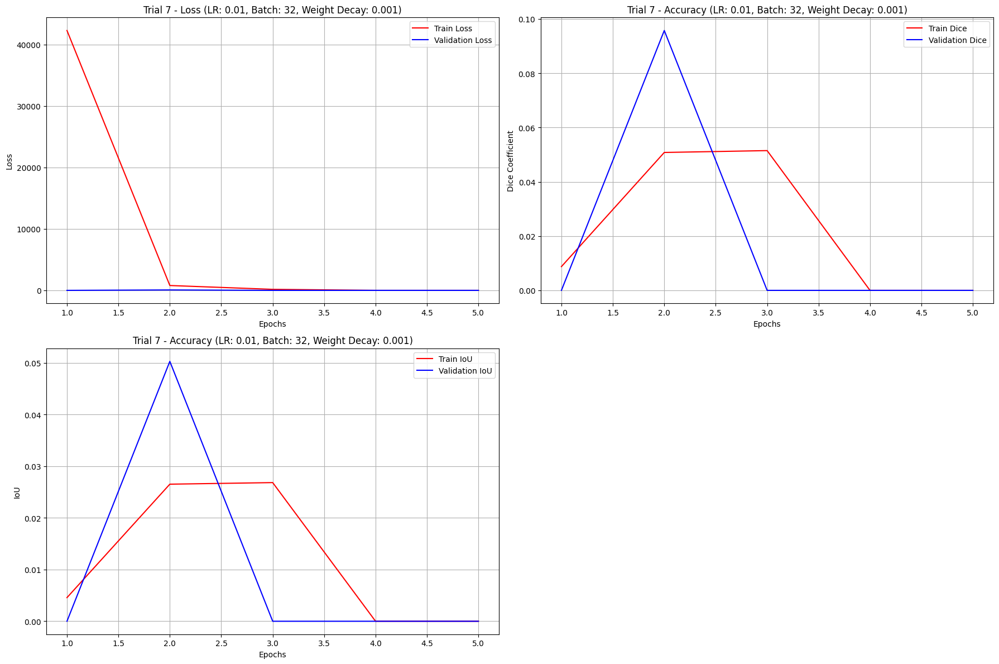



Trial 8/10 --> learning rate = 0.001, batch_size = 64, weight_decay = 0.0001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.81s/batch]

Training Loss: 0.6697


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.80s/batch]

Training Loss: 0.6301


Epoch 1 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.80s/batch]

Training Loss: 0.5603


Epoch 1 Training:  50%|█████     | 4/8 [00:15<00:15,  3.80s/batch]

Training Loss: 0.4197


Epoch 1 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.81s/batch]

Training Loss: 0.2684


Epoch 1 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.80s/batch]

Training Loss: 0.3217


Epoch 1 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.80s/batch]

Training Loss: 0.2820


Epoch 1 Training: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Training Loss: 0.2336




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.71s/batch]

Validation Loss: 0.2373


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.69s/batch]

Validation Loss: 0.2457


Epoch 1 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.03s/batch]


Validation Loss: 0.2332
Epoch 1, Validation Loss: 0.2405, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.80s/batch]

Training Loss: 0.2478


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.80s/batch]

Training Loss: 0.2432


Epoch 2 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.80s/batch]

Training Loss: 0.2309


Epoch 2 Training:  50%|█████     | 4/8 [00:15<00:15,  3.81s/batch]

Training Loss: 0.2279


Epoch 2 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.82s/batch]

Training Loss: 0.2126


Epoch 2 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.81s/batch]

Training Loss: 0.2035


Epoch 2 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.81s/batch]

Training Loss: 0.1823


Epoch 2 Training: 100%|██████████| 8/8 [00:30<00:00,  3.79s/batch]


Training Loss: 0.1663




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.68s/batch]

Validation Loss: 0.1406


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.70s/batch]

Validation Loss: 0.1466


Epoch 2 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.04s/batch]


Validation Loss: 0.1387
Epoch 2, Validation Loss: 0.1430, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Training Loss: 0.1563


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.80s/batch]

Training Loss: 0.1279


Epoch 3 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.82s/batch]

Training Loss: 0.1139


Epoch 3 Training:  50%|█████     | 4/8 [00:15<00:15,  3.81s/batch]

Training Loss: 0.1025


Epoch 3 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.82s/batch]

Training Loss: 0.0843


Epoch 3 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.81s/batch]

Training Loss: 0.0871


Epoch 3 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.80s/batch]

Training Loss: 0.0753


Epoch 3 Training: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Training Loss: 0.0749




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.71s/batch]

Validation Loss: 0.0719


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.69s/batch]

Validation Loss: 0.0734


Epoch 3 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.04s/batch]


Validation Loss: 0.0670
Epoch 3, Validation Loss: 0.0720, Validation Dice: 0.7651, Validation IoU: 0.6196




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Training Loss: 0.0755


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.82s/batch]

Training Loss: 0.0744


Epoch 4 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Training Loss: 0.0663


Epoch 4 Training:  50%|█████     | 4/8 [00:15<00:15,  3.83s/batch]

Training Loss: 0.0714


Epoch 4 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.83s/batch]

Training Loss: 0.0693


Epoch 4 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.82s/batch]

Training Loss: 0.0672


Epoch 4 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.82s/batch]

Training Loss: 0.0668


Epoch 4 Training: 100%|██████████| 8/8 [00:30<00:00,  3.80s/batch]


Training Loss: 0.0675




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.72s/batch]

Validation Loss: 0.0636


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.69s/batch]

Validation Loss: 0.0635


Epoch 4 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.04s/batch]


Validation Loss: 0.0574
Epoch 4, Validation Loss: 0.0628, Validation Dice: 0.7867, Validation IoU: 0.6485




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.83s/batch]

Training Loss: 0.0621


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.83s/batch]

Training Loss: 0.0735


Epoch 5 Training:  38%|███▊      | 3/8 [00:11<00:19,  3.81s/batch]

Training Loss: 0.0663


Epoch 5 Training:  50%|█████     | 4/8 [00:15<00:15,  3.80s/batch]

Training Loss: 0.0546


Epoch 5 Training:  62%|██████▎   | 5/8 [00:19<00:11,  3.79s/batch]

Training Loss: 0.0540


Epoch 5 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.79s/batch]

Training Loss: 0.0601


Epoch 5 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.80s/batch]

Training Loss: 0.0569


Epoch 5 Training: 100%|██████████| 8/8 [00:30<00:00,  3.78s/batch]


Training Loss: 0.0480




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.77s/batch]

Validation Loss: 0.0566


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.70s/batch]

Validation Loss: 0.0543


Epoch 5 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.05s/batch]


Validation Loss: 0.0489
Epoch 5, Validation Loss: 0.0547, Validation Dice: 0.7956, Validation IoU: 0.6608




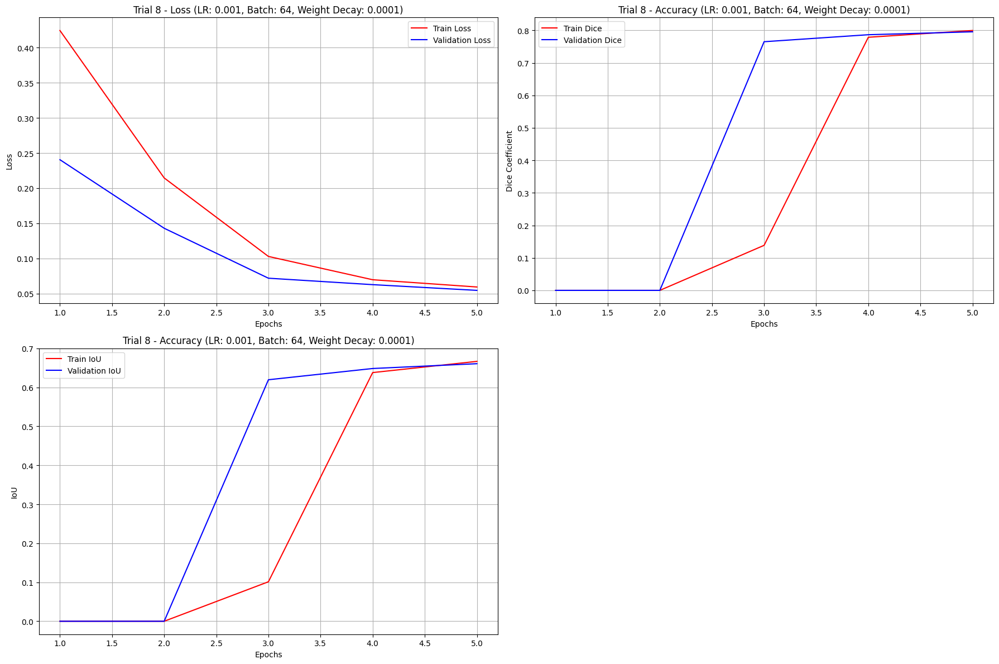



Trial 9/10 --> learning rate = 0.01, batch_size = 16, weight_decay = 0.001


Epoch 1 Training:   3%|▎         | 1/32 [00:00<00:29,  1.07batch/s]

Training Loss: 0.6793


Epoch 1 Training:   6%|▋         | 2/32 [00:01<00:28,  1.05batch/s]

Training Loss: 0.2648


Epoch 1 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.3270


Epoch 1 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 46.4947


Epoch 1 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.05batch/s]

Training Loss: 0.8721


Epoch 1 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.04batch/s]

Training Loss: 0.1819


Epoch 1 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.05batch/s]

Training Loss: 189.1429


Epoch 1 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 0.1689


Epoch 1 Training:  28%|██▊       | 9/32 [00:08<00:22,  1.04batch/s]

Training Loss: 0.2398


Epoch 1 Training:  31%|███▏      | 10/32 [00:09<00:21,  1.04batch/s]

Training Loss: 0.2080


Epoch 1 Training:  34%|███▍      | 11/32 [00:10<00:20,  1.05batch/s]

Training Loss: 30.1229


Epoch 1 Training:  38%|███▊      | 12/32 [00:11<00:19,  1.05batch/s]

Training Loss: 0.4829


Epoch 1 Training:  41%|████      | 13/32 [00:12<00:18,  1.05batch/s]

Training Loss: 11092.7090


Epoch 1 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.05batch/s]

Training Loss: 9134.4043


Epoch 1 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 1117.8540


Epoch 1 Training:  50%|█████     | 16/32 [00:15<00:15,  1.06batch/s]

Training Loss: 565.7883


Epoch 1 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.06batch/s]

Training Loss: 68.7894


Epoch 1 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.06batch/s]

Training Loss: 648.5189


Epoch 1 Training:  59%|█████▉    | 19/32 [00:18<00:12,  1.06batch/s]

Training Loss: 68.3427


Epoch 1 Training:  62%|██████▎   | 20/32 [00:19<00:11,  1.05batch/s]

Training Loss: 941.2455


Epoch 1 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.06batch/s]

Training Loss: 988.1483


Epoch 1 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.06batch/s]

Training Loss: 694.5031


Epoch 1 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 11.1018


Epoch 1 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.06batch/s]

Training Loss: 21960.3359


Epoch 1 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 6868.2646


Epoch 1 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.06batch/s]

Training Loss: 41.8277


Epoch 1 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.06batch/s]

Training Loss: 1880.6475


Epoch 1 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.06batch/s]

Training Loss: 52.6149


Epoch 1 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.06batch/s]

Training Loss: 8.1825


Epoch 1 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.06batch/s]

Training Loss: 18.1620


Epoch 1 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.06batch/s]

Training Loss: 5147.4204


Epoch 1 Training: 100%|██████████| 32/32 [00:30<00:00,  1.06batch/s]


Training Loss: 13.2519




Epoch 1 Validation:  10%|█         | 1/10 [00:00<00:06,  1.42batch/s]

Validation Loss: 107.5789


Epoch 1 Validation:  20%|██        | 2/10 [00:01<00:05,  1.47batch/s]

Validation Loss: 108.5033


Epoch 1 Validation:  30%|███       | 3/10 [00:02<00:04,  1.47batch/s]

Validation Loss: 106.5591


Epoch 1 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 106.4466


Epoch 1 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.49batch/s]

Validation Loss: 108.5210


Epoch 1 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 106.5105


Epoch 1 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 108.2892


Epoch 1 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 105.8338


Epoch 1 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.63batch/s]


Validation Loss: 108.4627
Validation Loss: 104.9001
Epoch 1, Validation Loss: 107.3944, Validation Dice: 0.0957, Validation IoU: 0.0503




Epoch 2 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 119.7369


Epoch 2 Training:   6%|▋         | 2/32 [00:01<00:28,  1.06batch/s]

Training Loss: 369.9280


Epoch 2 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 35.4169


Epoch 2 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 1.3132


Epoch 2 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.6386


Epoch 2 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 4.5664


Epoch 2 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 0.6361


Epoch 2 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.06batch/s]

Training Loss: 673.9537


Epoch 2 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.06batch/s]

Training Loss: 0.6251


Epoch 2 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.6226


Epoch 2 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.07batch/s]

Training Loss: 0.6131


Epoch 2 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.06batch/s]

Training Loss: 0.5880


Epoch 2 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 60598.7266


Epoch 2 Training:  44%|████▍     | 14/32 [00:13<00:17,  1.06batch/s]

Training Loss: 99.7945


Epoch 2 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 219.7121


Epoch 2 Training:  50%|█████     | 16/32 [00:15<00:15,  1.06batch/s]

Training Loss: 0.4511


Epoch 2 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.06batch/s]

Training Loss: 0.5864


Epoch 2 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 7.8531


Epoch 2 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.06batch/s]

Training Loss: 0.3270


Epoch 2 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.05batch/s]

Training Loss: 52.2530


Epoch 2 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.05batch/s]

Training Loss: 38.4828


Epoch 2 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.06batch/s]

Training Loss: 0.6764


Epoch 2 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.06batch/s]

Training Loss: 0.5799


Epoch 2 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 1.6685


Epoch 2 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 0.6101


Epoch 2 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.5935


Epoch 2 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.06batch/s]

Training Loss: 0.5648


Epoch 2 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 26.4031


Epoch 2 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.07batch/s]

Training Loss: 2.1766


Epoch 2 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.06batch/s]

Training Loss: 0.4688


Epoch 2 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.06batch/s]

Training Loss: 0.4028


Epoch 2 Training: 100%|██████████| 32/32 [00:30<00:00,  1.07batch/s]


Training Loss: 0.5738




Epoch 2 Validation:  10%|█         | 1/10 [00:00<00:05,  1.50batch/s]

Validation Loss: 0.3083


Epoch 2 Validation:  20%|██        | 2/10 [00:01<00:05,  1.49batch/s]

Validation Loss: 0.3285


Epoch 2 Validation:  30%|███       | 3/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.3947


Epoch 2 Validation:  40%|████      | 4/10 [00:02<00:04,  1.49batch/s]

Validation Loss: 0.3860


Epoch 2 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.50batch/s]

Validation Loss: 0.3376


Epoch 2 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.50batch/s]

Validation Loss: 0.4147


Epoch 2 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.3351


Epoch 2 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.4374


Epoch 2 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.64batch/s]


Validation Loss: 0.3477
Validation Loss: 0.3699
Epoch 2, Validation Loss: 0.3656, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.5816


Epoch 3 Training:   6%|▋         | 2/32 [00:01<00:28,  1.06batch/s]

Training Loss: 0.5920


Epoch 3 Training:   9%|▉         | 3/32 [00:02<00:27,  1.06batch/s]

Training Loss: 0.5436


Epoch 3 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 11.3182


Epoch 3 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.3455


Epoch 3 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.05batch/s]

Training Loss: 0.5073


Epoch 3 Training:  22%|██▏       | 7/32 [00:06<00:24,  1.04batch/s]

Training Loss: 12.1552


Epoch 3 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 2.3577


Epoch 3 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.05batch/s]

Training Loss: 0.5005


Epoch 3 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 677.9471


Epoch 3 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.06batch/s]

Training Loss: 2.2665


Epoch 3 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.07batch/s]

Training Loss: 2.5276


Epoch 3 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.3698


Epoch 3 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.06batch/s]

Training Loss: 0.9020


Epoch 3 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 0.4269


Epoch 3 Training:  50%|█████     | 16/32 [00:15<00:15,  1.06batch/s]

Training Loss: 0.5636


Epoch 3 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.06batch/s]

Training Loss: 13.5092


Epoch 3 Training:  56%|█████▋    | 18/32 [00:17<00:13,  1.06batch/s]

Training Loss: 0.5677


Epoch 3 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.06batch/s]

Training Loss: 0.5607


Epoch 3 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.06batch/s]

Training Loss: 0.5556


Epoch 3 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.07batch/s]

Training Loss: 0.5543


Epoch 3 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.07batch/s]

Training Loss: 0.5513


Epoch 3 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.07batch/s]

Training Loss: 0.5441


Epoch 3 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.5472


Epoch 3 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.5391


Epoch 3 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.5360


Epoch 3 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.5267


Epoch 3 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.06batch/s]

Training Loss: 3305.7998


Epoch 3 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.07batch/s]

Training Loss: 7.5827


Epoch 3 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.07batch/s]

Training Loss: 3.6445


Epoch 3 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.06batch/s]

Training Loss: 1259.2848


Epoch 3 Training: 100%|██████████| 32/32 [00:30<00:00,  1.07batch/s]


Training Loss: 9.2349




Epoch 3 Validation:  10%|█         | 1/10 [00:00<00:06,  1.38batch/s]

Validation Loss: 0.6643


Epoch 3 Validation:  20%|██        | 2/10 [00:01<00:05,  1.45batch/s]

Validation Loss: 0.6661


Epoch 3 Validation:  30%|███       | 3/10 [00:02<00:04,  1.47batch/s]

Validation Loss: 0.6665


Epoch 3 Validation:  40%|████      | 4/10 [00:02<00:04,  1.47batch/s]

Validation Loss: 0.6678


Epoch 3 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.48batch/s]

Validation Loss: 0.6668


Epoch 3 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.6673


Epoch 3 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.49batch/s]

Validation Loss: 0.6678


Epoch 3 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.6702


Epoch 3 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.62batch/s]


Validation Loss: 0.6689
Validation Loss: 0.6641
Epoch 3, Validation Loss: 0.6673, Validation Dice: 0.0019, Validation IoU: 0.0009




Epoch 4 Training:   3%|▎         | 1/32 [00:00<00:29,  1.05batch/s]

Training Loss: 0.6853


Epoch 4 Training:   6%|▋         | 2/32 [00:01<00:28,  1.06batch/s]

Training Loss: 0.5372


Epoch 4 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.5007


Epoch 4 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.06batch/s]

Training Loss: 0.5003


Epoch 4 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.07batch/s]

Training Loss: 0.4950


Epoch 4 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.06batch/s]

Training Loss: 151.8137


Epoch 4 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 36.5603


Epoch 4 Training:  25%|██▌       | 8/32 [00:07<00:23,  1.04batch/s]

Training Loss: 0.4837


Epoch 4 Training:  28%|██▊       | 9/32 [00:08<00:22,  1.05batch/s]

Training Loss: 0.5673


Epoch 4 Training:  31%|███▏      | 10/32 [00:09<00:21,  1.05batch/s]

Training Loss: 0.4803


Epoch 4 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.05batch/s]

Training Loss: 0.4761


Epoch 4 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.06batch/s]

Training Loss: 0.4725


Epoch 4 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.4741


Epoch 4 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.06batch/s]

Training Loss: 0.4664


Epoch 4 Training:  47%|████▋     | 15/32 [00:14<00:16,  1.06batch/s]

Training Loss: 0.4611


Epoch 4 Training:  50%|█████     | 16/32 [00:15<00:14,  1.07batch/s]

Training Loss: 0.4607


Epoch 4 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.07batch/s]

Training Loss: 0.4597


Epoch 4 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.07batch/s]

Training Loss: 0.4529


Epoch 4 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.06batch/s]

Training Loss: 0.4581


Epoch 4 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.06batch/s]

Training Loss: 0.4503


Epoch 4 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.05batch/s]

Training Loss: 0.4455


Epoch 4 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.06batch/s]

Training Loss: 0.4430


Epoch 4 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.06batch/s]

Training Loss: 0.4293


Epoch 4 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.07batch/s]

Training Loss: 0.4379


Epoch 4 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.07batch/s]

Training Loss: 0.4222


Epoch 4 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.07batch/s]

Training Loss: 0.4292


Epoch 4 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.07batch/s]

Training Loss: 0.4202


Epoch 4 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.07batch/s]

Training Loss: 0.4082


Epoch 4 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.07batch/s]

Training Loss: 0.4149


Epoch 4 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.07batch/s]

Training Loss: 0.3999


Epoch 4 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.07batch/s]

Training Loss: 0.4067


Epoch 4 Training: 100%|██████████| 32/32 [00:29<00:00,  1.07batch/s]


Training Loss: 0.3957




Epoch 4 Validation:  10%|█         | 1/10 [00:00<00:06,  1.41batch/s]

Validation Loss: 0.3909


Epoch 4 Validation:  20%|██        | 2/10 [00:01<00:05,  1.42batch/s]

Validation Loss: 0.3931


Epoch 4 Validation:  30%|███       | 3/10 [00:02<00:04,  1.44batch/s]

Validation Loss: 0.4012


Epoch 4 Validation:  40%|████      | 4/10 [00:02<00:04,  1.45batch/s]

Validation Loss: 0.4008


Epoch 4 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.45batch/s]

Validation Loss: 0.3938


Epoch 4 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.48batch/s]

Validation Loss: 0.4035


Epoch 4 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.47batch/s]

Validation Loss: 0.3933


Epoch 4 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.49batch/s]

Validation Loss: 0.4074


Epoch 4 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.61batch/s]


Validation Loss: 0.3958
Validation Loss: 0.4015
Epoch 4, Validation Loss: 0.3978, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:   3%|▎         | 1/32 [00:00<00:29,  1.06batch/s]

Training Loss: 0.4029


Epoch 5 Training:   6%|▋         | 2/32 [00:01<00:27,  1.08batch/s]

Training Loss: 0.3917


Epoch 5 Training:   9%|▉         | 3/32 [00:02<00:27,  1.07batch/s]

Training Loss: 0.3929


Epoch 5 Training:  12%|█▎        | 4/32 [00:03<00:26,  1.07batch/s]

Training Loss: 0.3930


Epoch 5 Training:  16%|█▌        | 5/32 [00:04<00:25,  1.06batch/s]

Training Loss: 0.3826


Epoch 5 Training:  19%|█▉        | 6/32 [00:05<00:24,  1.07batch/s]

Training Loss: 0.3806


Epoch 5 Training:  22%|██▏       | 7/32 [00:06<00:23,  1.06batch/s]

Training Loss: 0.3796


Epoch 5 Training:  25%|██▌       | 8/32 [00:07<00:22,  1.05batch/s]

Training Loss: 0.3746


Epoch 5 Training:  28%|██▊       | 9/32 [00:08<00:21,  1.05batch/s]

Training Loss: 0.3716


Epoch 5 Training:  31%|███▏      | 10/32 [00:09<00:20,  1.06batch/s]

Training Loss: 0.3658


Epoch 5 Training:  34%|███▍      | 11/32 [00:10<00:19,  1.06batch/s]

Training Loss: 0.3790


Epoch 5 Training:  38%|███▊      | 12/32 [00:11<00:18,  1.06batch/s]

Training Loss: 0.3742


Epoch 5 Training:  41%|████      | 13/32 [00:12<00:17,  1.06batch/s]

Training Loss: 0.3816


Epoch 5 Training:  44%|████▍     | 14/32 [00:13<00:16,  1.06batch/s]

Training Loss: 0.3658


Epoch 5 Training:  47%|████▋     | 15/32 [00:14<00:15,  1.06batch/s]

Training Loss: 0.3627


Epoch 5 Training:  50%|█████     | 16/32 [00:15<00:15,  1.06batch/s]

Training Loss: 0.3627


Epoch 5 Training:  53%|█████▎    | 17/32 [00:16<00:14,  1.06batch/s]

Training Loss: 0.3517


Epoch 5 Training:  56%|█████▋    | 18/32 [00:16<00:13,  1.05batch/s]

Training Loss: 0.3531


Epoch 5 Training:  59%|█████▉    | 19/32 [00:17<00:12,  1.06batch/s]

Training Loss: 0.3478


Epoch 5 Training:  62%|██████▎   | 20/32 [00:18<00:11,  1.06batch/s]

Training Loss: 0.3442


Epoch 5 Training:  66%|██████▌   | 21/32 [00:19<00:10,  1.04batch/s]

Training Loss: 0.3447


Epoch 5 Training:  69%|██████▉   | 22/32 [00:20<00:09,  1.04batch/s]

Training Loss: 0.3455


Epoch 5 Training:  72%|███████▏  | 23/32 [00:21<00:08,  1.04batch/s]

Training Loss: 0.3365


Epoch 5 Training:  75%|███████▌  | 24/32 [00:22<00:07,  1.05batch/s]

Training Loss: 0.3411


Epoch 5 Training:  78%|███████▊  | 25/32 [00:23<00:06,  1.06batch/s]

Training Loss: 0.3439


Epoch 5 Training:  81%|████████▏ | 26/32 [00:24<00:05,  1.06batch/s]

Training Loss: 0.3295


Epoch 5 Training:  84%|████████▍ | 27/32 [00:25<00:04,  1.06batch/s]

Training Loss: 0.3316


Epoch 5 Training:  88%|████████▊ | 28/32 [00:26<00:03,  1.06batch/s]

Training Loss: 0.3447


Epoch 5 Training:  91%|█████████ | 29/32 [00:27<00:02,  1.06batch/s]

Training Loss: 0.3470


Epoch 5 Training:  94%|█████████▍| 30/32 [00:28<00:01,  1.06batch/s]

Training Loss: 0.3247


Epoch 5 Training:  97%|█████████▋| 31/32 [00:29<00:00,  1.06batch/s]

Training Loss: 0.3280


Epoch 5 Training: 100%|██████████| 32/32 [00:30<00:00,  1.06batch/s]


Training Loss: 0.3211




Epoch 5 Validation:  10%|█         | 1/10 [00:00<00:06,  1.47batch/s]

Validation Loss: 0.3044


Epoch 5 Validation:  20%|██        | 2/10 [00:01<00:05,  1.43batch/s]

Validation Loss: 0.3075


Epoch 5 Validation:  30%|███       | 3/10 [00:02<00:04,  1.46batch/s]

Validation Loss: 0.3196


Epoch 5 Validation:  40%|████      | 4/10 [00:02<00:04,  1.41batch/s]

Validation Loss: 0.3190


Epoch 5 Validation:  50%|█████     | 5/10 [00:03<00:03,  1.45batch/s]

Validation Loss: 0.3086


Epoch 5 Validation:  60%|██████    | 6/10 [00:04<00:02,  1.44batch/s]

Validation Loss: 0.3231


Epoch 5 Validation:  70%|███████   | 7/10 [00:04<00:02,  1.46batch/s]

Validation Loss: 0.3079


Epoch 5 Validation:  80%|████████  | 8/10 [00:05<00:01,  1.48batch/s]

Validation Loss: 0.3287


Epoch 5 Validation: 100%|██████████| 10/10 [00:06<00:00,  1.60batch/s]


Validation Loss: 0.3116
Validation Loss: 0.3199
Epoch 5, Validation Loss: 0.3145, Validation Dice: 0.0000, Validation IoU: 0.0000




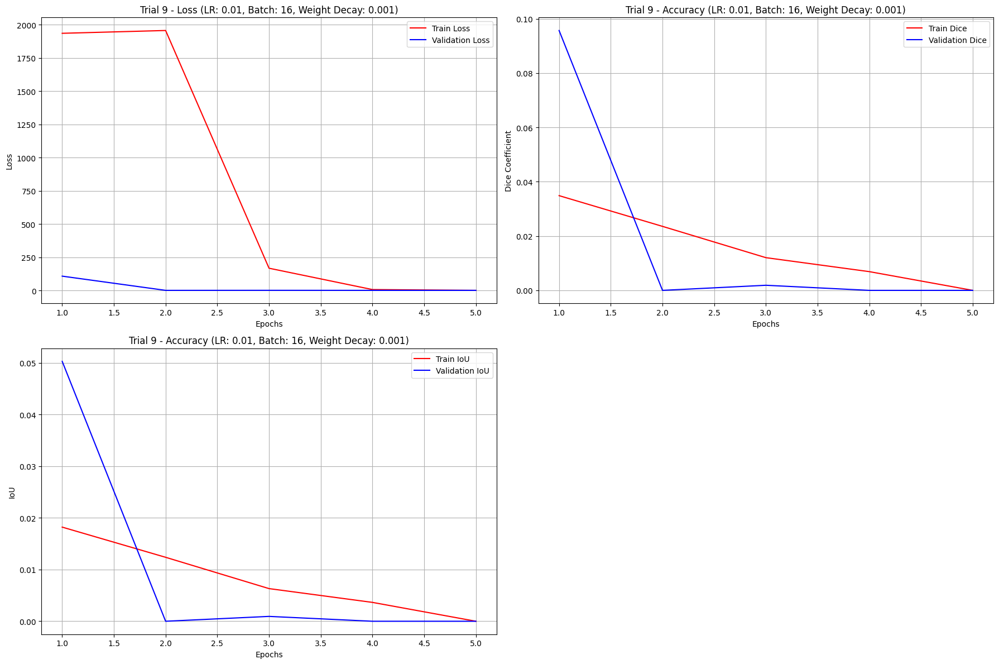



Trial 10/10 --> learning rate = 0.01, batch_size = 64, weight_decay = 0.001


Epoch 1 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.80s/batch]

Training Loss: 0.6424


Epoch 1 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.81s/batch]

Training Loss: 0.3961


Epoch 1 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.79s/batch]

Training Loss: 0.6081


Epoch 1 Training:  50%|█████     | 4/8 [00:15<00:15,  3.77s/batch]

Training Loss: 0.5186


Epoch 1 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.78s/batch]

Training Loss: 0.2589


Epoch 1 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.76s/batch]

Training Loss: 0.3214


Epoch 1 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Training Loss: 0.2022


Epoch 1 Training: 100%|██████████| 8/8 [00:29<00:00,  3.75s/batch]


Training Loss: 0.2695




Epoch 1 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.72s/batch]

Validation Loss: 0.1157


Epoch 1 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.71s/batch]

Validation Loss: 0.1240


Epoch 1 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.05s/batch]


Validation Loss: 0.1138
Epoch 1, Validation Loss: 0.1192, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 2 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/batch]

Training Loss: 0.1277


Epoch 2 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.77s/batch]

Training Loss: 37.3396


Epoch 2 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.76s/batch]

Training Loss: 1.1245


Epoch 2 Training:  50%|█████     | 4/8 [00:15<00:15,  3.76s/batch]

Training Loss: 147.0843


Epoch 2 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.77s/batch]

Training Loss: 1.0934


Epoch 2 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.78s/batch]

Training Loss: 0.7887


Epoch 2 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.77s/batch]

Training Loss: 2.2698


Epoch 2 Training: 100%|██████████| 8/8 [00:29<00:00,  3.75s/batch]


Training Loss: 0.3706




Epoch 2 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.74s/batch]

Validation Loss: 9.9222


Epoch 2 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.69s/batch]

Validation Loss: 10.6985


Epoch 2 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.04s/batch]


Validation Loss: 9.7941
Epoch 2, Validation Loss: 10.2498, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 3 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Training Loss: 12.1726


Epoch 3 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.77s/batch]

Training Loss: 0.4753


Epoch 3 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.77s/batch]

Training Loss: 144.0558


Epoch 3 Training:  50%|█████     | 4/8 [00:15<00:15,  3.77s/batch]

Training Loss: 37.5235


Epoch 3 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.77s/batch]

Training Loss: 155.1365


Epoch 3 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.77s/batch]

Training Loss: 29472.1660


Epoch 3 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.76s/batch]

Training Loss: 65.6118


Epoch 3 Training: 100%|██████████| 8/8 [00:29<00:00,  3.74s/batch]


Training Loss: 59.2008




Epoch 3 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.71s/batch]

Validation Loss: 0.5950


Epoch 3 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.70s/batch]

Validation Loss: 0.5957


Epoch 3 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.04s/batch]


Validation Loss: 0.5949
Epoch 3, Validation Loss: 0.5953, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 4 Training:  12%|█▎        | 1/8 [00:03<00:25,  3.71s/batch]

Training Loss: 5.1810


Epoch 4 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.72s/batch]

Training Loss: 0.5969


Epoch 4 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.72s/batch]

Training Loss: 0.5964


Epoch 4 Training:  50%|█████     | 4/8 [00:14<00:14,  3.71s/batch]

Training Loss: 0.5942


Epoch 4 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.72s/batch]

Training Loss: 16.6528


Epoch 4 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.73s/batch]

Training Loss: 0.5890


Epoch 4 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.72s/batch]

Training Loss: 0.5844


Epoch 4 Training: 100%|██████████| 8/8 [00:29<00:00,  3.70s/batch]


Training Loss: 0.6097




Epoch 4 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.76s/batch]

Validation Loss: 35.6203


Epoch 4 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.74s/batch]

Validation Loss: 38.5702


Epoch 4 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.08s/batch]


Validation Loss: 35.0835
Epoch 4, Validation Loss: 36.8594, Validation Dice: 0.0000, Validation IoU: 0.0000




Epoch 5 Training:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/batch]

Training Loss: 72.2366


Epoch 5 Training:  25%|██▌       | 2/8 [00:07<00:22,  3.76s/batch]

Training Loss: 16.9543


Epoch 5 Training:  38%|███▊      | 3/8 [00:11<00:18,  3.73s/batch]

Training Loss: 0.5735


Epoch 5 Training:  50%|█████     | 4/8 [00:14<00:14,  3.72s/batch]

Training Loss: 3178.1924


Epoch 5 Training:  62%|██████▎   | 5/8 [00:18<00:11,  3.73s/batch]

Training Loss: 72.9003


Epoch 5 Training:  75%|███████▌  | 6/8 [00:22<00:07,  3.76s/batch]

Training Loss: 15.1308


Epoch 5 Training:  88%|████████▊ | 7/8 [00:26<00:03,  3.73s/batch]

Training Loss: 657.6943


Epoch 5 Training: 100%|██████████| 8/8 [00:29<00:00,  3.71s/batch]


Training Loss: 123.8649




Epoch 5 Validation:  33%|███▎      | 1/3 [00:02<00:05,  2.69s/batch]

Validation Loss: 0.4029


Epoch 5 Validation:  67%|██████▋   | 2/3 [00:05<00:02,  2.73s/batch]

Validation Loss: 0.4063


Epoch 5 Validation: 100%|██████████| 3/3 [00:06<00:00,  2.07s/batch]


Validation Loss: 0.4019
Epoch 5, Validation Loss: 0.4043, Validation Dice: 0.0000, Validation IoU: 0.0000




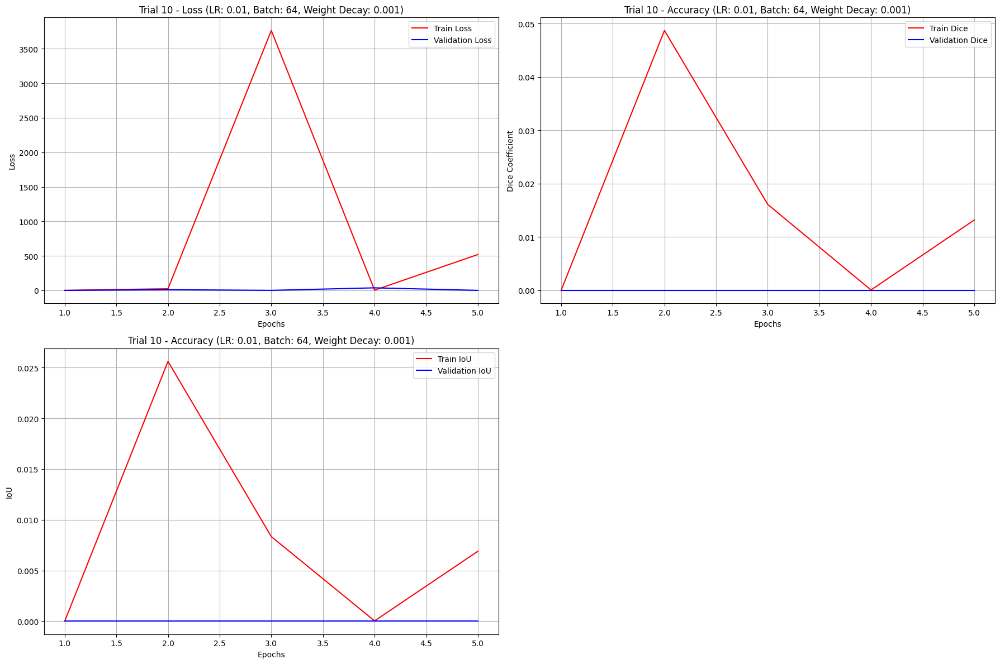



Best validation loss: 0.03672813449440331
Best params: learning rate = 0.001, batch size = 16, weight_decay = 0.0001


In [ ]:
image_dir = '/content/drive/MyDrive/StrawberryDataset/images'
mask_dir = '/content/drive/MyDrive/StrawberryDataset/masks'

# Creazione dataset
dataset = StrawberryDataset(image_dir=image_dir, mask_dir=mask_dir, image_transform=image_transform, mask_transform=mask_transform)

# Creazione trainset (70%), validationset (20%) e trainset (10%)
train_size = int(0.7 * len(dataset))
validation_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - validation_size

trainset, validationset, testset = random_split(dataset, [train_size, validation_size, test_size])

criterion = nn.BCEWithLogitsLoss()

# Tuning degli iperparametri
best_params = hyperparameter_tuning(trainset, validationset, criterion, device)

TESTING...
Final test loss: 0.03489089223581392, Final test Dice: 0.8765, Final test IoU: 0.7803
ALCUNE PREDIZIONI CORRETTE 



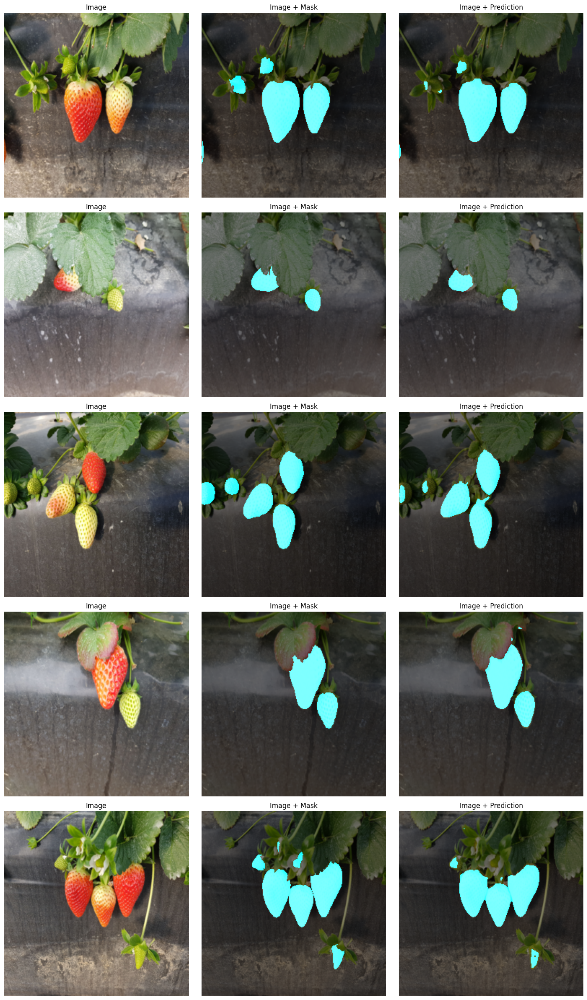

ALCUNE PREDIZIONI ERRATE 



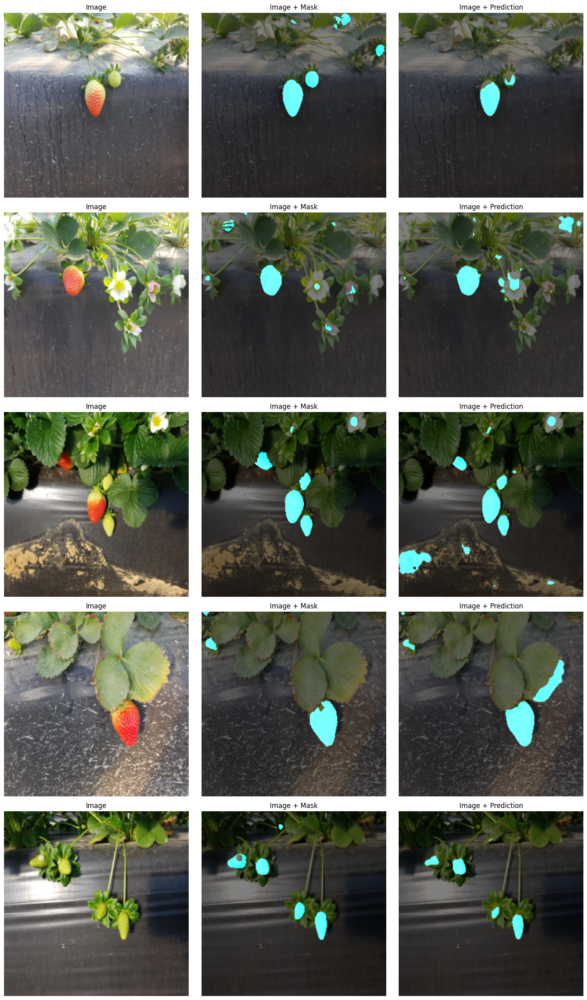

In [21]:
# Caricamento miglior modello e failure analysis
model = UNet(in_channels=3, out_channels=1).to(device)
model.load_state_dict(torch.load('best_model.pth', weights_only=True))

failure_analysis(model, criterion, testset, best_params, device)

# **TRANSFER LEARNING**

**NUOVO DATASET**

In [ ]:
class TomatoDataset(Dataset):
    def __init__(self, image_dir, mask_dir, image_transform = None, mask_transform = None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform

        self.images = []
        self.masks = []

        for image in os.listdir(image_dir) :
            self.images.append(os.path.join(image_dir,image))
            self.masks.append(os.path.join(mask_dir,image))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = Image.open(self.images[idx]).convert("RGB")
        mask = Image.open(self.masks[idx]).convert("RGB")

        if self.image_transform:
            image = self.image_transform(image)

        if self.mask_transform:
            mask = self.mask_transform(mask)

        #Trasformo la maschera in scala di grigi
        mask = np.array(mask)

        mask = np.where(np.all(mask == [255, 0, 255], axis=-1), 0, mask)  #fully_ripened
        mask = np.where(np.all(mask == [255, 165, 0], axis=-1), 1, mask)  #half_ripened
        mask = np.where(np.all(mask == [0, 255, 0], axis=-1), 2, mask)    #green

        mask = torch.tensor(mask, dtype=torch.long)

        return image, mask

In [ ]:
#Trasformazioni per le immagini
new_image_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

#Trasformazioni per le maschere
new_mask_transform = transforms.Compose([
    transforms.Resize((256,256), interpolation = transforms.InterpolationMode.NEAREST)
])

**FREEZE FUNCTION PER UNET**

In [ ]:
#Uso il modello preaddestrato in precedenza, ma congelo i pesi della parte di encoder e modifico solo quelli della parte di decoder
def freeze_layers(model):
    for param in model.enc1.parameters():
        param.requires_grad = False
    for param in model.enc2.parameters():
        param.requires_grad = False
    for param in model.enc3.parameters():
        param.requires_grad = False
    for param in model.enc4.parameters():
        param.requires_grad = False
    for param in model.bottleneck.parameters():
        param.requires_grad = False

**NUOVA FUNZIONE DI TRAINING (MODIFICA CALCOLO ACCURATEZZA, CRITERION E OPTIMIZER)**

In [ ]:
def train_and_validate_multiclass(model, train_loader, validation_loader, device, optimizer, criterion, epochs):
    train_losses = []
    val_losses = []
    train_acc = []
    val_acc = []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        #Addestramento
        with tqdm(train_loader, desc=f"Epoch {epoch+1} Training", unit="batch") as tepoch:
          for images, masks in tepoch:

              images, masks = images.to(device), masks.to(device)

              optimizer.zero_grad()

              outputs = model(images)

              loss = criterion(outputs, masks)
              running_loss += loss.item() * images.size(0)
              loss.backward()
              torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0) #Prevengo l'esplosione dei gradienti

              optimizer.step()

              _, predicted = torch.max(outputs, 1)
              correct += (predicted == masks).sum().item()
              total += masks.numel()

              tepoch.write(f"Training Loss: {loss.item():.4f}")


        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = correct / total
        train_losses.append(epoch_loss)
        train_acc.append(epoch_acc)

        print('\n')

        #Validazione
        model.eval()
        running_loss = 0.0
        correct = 0
        total = 0

        with torch.no_grad():
          with tqdm(validation_loader, desc=f"Epoch {epoch+1} Validation", unit="batch") as tepoch:
            for images, masks in tepoch:

                images, masks = images.to(device), masks.to(device)

                outputs = model(images)

                loss = criterion(outputs, masks)
                running_loss += loss.item() * images.size(0)

                _, predicted = torch.max(outputs, 1)
                correct += (predicted == masks).sum().item()
                total += masks.numel()

                tepoch.write(f"Validation Loss: {loss.item():.4f}")


        val_loss = running_loss / len(validation_loader.dataset)
        validation_acc = correct / total
        val_losses.append(val_loss)
        val_acc.append(validation_acc)
        print(f'Epoch {epoch + 1}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {100*validation_acc:4.2f}%')
        print('\n')

    return train_losses, val_losses, train_acc, val_acc




**NUOVA FUNZIONE PER TUNING IPERPARAMETRI CON MODIFICA MODELLO E OPTIMIZER**

In [ ]:
def hyperparameter_tuning_multiclass(trainset, validationset, criterion, device, num_trials=10, num_epochs=5):
    best_loss = float('inf')
    best_params = None
    best_model_wts = None

    for trial in range(num_trials):
        lr, batch_size, weight_decay = random_hyperparameters()
        print(f'Trial {trial+1}/{num_trials} --> learning rate = {lr}, batch_size = {batch_size}, weight_decay = {weight_decay}')

        model = UNet(in_channels=3, out_channels=3).to(device)
        model.load_state_dict(torch.load('best_model.pth', weights_only=True))
        freeze_layers(model)
        param_decoder = [param for param in model.parameters() if param.requires_grad]
        optimizer = optim.Adam(param_decoder, lr=lr, weight_decay=weight_decay)

        train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
        validation_loader = DataLoader(validationset, batch_size=batch_size, shuffle=False)

        train_losses, val_losses, train_acc, val_acc = train_and_validate_multiclass(model, train_loader, validation_loader, device, optimizer, criterion, num_epochs)

        bvloss = min(val_losses)
        if (bvloss < best_loss):
            best_loss = bvloss
            best_params = (lr, batch_size, weight_decay)
            best_model_wts = model.state_dict()

        #Rappresentazione grafica
        plt.figure(figsize=(14,6))

        plt.subplot(1, 2, 1)
        plt.plot(range(1, num_epochs+1), train_losses, label='Train Loss', color='red')
        plt.plot(range(1, num_epochs+1), val_losses, label='Validation Loss', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title(f'Trial {trial + 1} - Loss (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.subplot(1, 2, 2)
        plt.plot(range(1, num_epochs+1), train_acc, label='Train Accuracy', color='red')
        plt.plot(range(1, num_epochs+1), val_acc, label='Validation Accuracy', color='blue')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.title(f'Trial {trial + 1} - Accuracy (LR: {lr}, Batch: {batch_size}, Weight Decay: {weight_decay})')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()
        plt.show()

    torch.save(best_model_wts, 'best_model_multiclass.pth')

    return best_params

**NUOVA FUNZIONE PER FAILURE ANALYSIS**

In [ ]:
def show_predictions_multiclass(images, masks, predictions, num_images=5, title=None):
    #Nuova funzione di overlay che tiene conto di piu classi
    def overlay_multiclass(image, mask):
        image = image.permute(1, 2, 0).cpu().numpy()
        mask = mask.squeeze().cpu().numpy()

        colors = np.array([
            [255, 0, 255],
            [255, 165, 0],
            [0, 255, 0]
        ])

        color_mask = colors[mask]

        return np.clip(image * 0.5 + color_mask * 0.5, 0, 1)


    fig, axes = plt.subplots(num_images, 3, figsize=(15, num_images*5))

    if title:
        fig.suptitle(title, fontsize=16, y=0.95)

    for i in range(num_images):
        ax = axes[i]
        image = images[i]
        mask = masks[i]
        prediction = predictions[i]

        ax[0].imshow(image.permute(1, 2, 0).cpu().numpy())
        ax[0].set_title("Image")
        ax[0].axis('off')

        image_mask = overlay_multiclass(image, mask)
        ax[1].imshow(image_mask)
        ax[1].set_title("Image + Mask")
        ax[1].axis('off')

        image_prediction = overlay_multiclass(image, prediction)
        ax[2].imshow(image_prediction)
        ax[2].set_title("Image + Prediction")
        ax[2].axis('off')

    plt.tight_layout()
    plt.show()


def failure_analysis_multiclass(model, criterion, testset, best_params, device):
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0
    images_list = []
    masks_list = []
    preds_list = []

    test_loader = DataLoader(testset, batch_size=best_params[1], shuffle=False)

    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)
            test_loss += loss.item() * images.size(0)

            _, predictions = torch.max(outputs, 1)
            correct += (predictions == masks).sum().item()
            total += masks.numel()

            images_list.extend(images)
            masks_list.extend(masks)
            preds_list.extend(predictions)

    test_loss /= len(test_loader.dataset)
    test_accuracy = correct / total

    print(f"Final test loss: {test_loss}, Final test accuracy: {test_accuracy}")

    errors_index = []
    correct_index = []
    for i in range(len(images_list)):
        if not np.array_equal(preds_list[i].numpy(), masks_list[i].numpy()):
            errors_index.append(i)
        else:
            correct_index.append(i)

    if correct_index:
        show_predictions_multiclass(
            [images_list[i] for i in correct_index[:5]],
            [masks_list[i] for i in correct_index[:5]],
            [preds_list[i] for i in correct_index[:5]],
            title="Alcune predizioni corrette"
        )

    if errors_index:
        show_predictions_multiclass(
            [images_list[i] for i in errors_index[:5]],
            [masks_list[i] for i in errors_index[:5]],
            [preds_list[i] for i in errors_index[:5]],
            title="Alcune predizioni errate"
        )



**MAIN TRANSFER LEARNING**

In [ ]:
image_dir = '/content/drive/MyDrive/TomatoDataset/img'
mask_dir = '/content/drive/MyDrive/TomatoDataset/masks'

# Creazione dataset
dataset = TomatoDataset(image_dir=image_dir, mask_dir=mask_dir, image_transform=new_image_transform, mask_transform=new_mask_transform)

# Creazione trainset (70%), validationset (20%) e trainset (10%)
train_size = int(0.7 * len(dataset))
validation_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - validation_size

trainset, validationset, testset = random_split(dataset, [train_size, validation_size, test_size])

criterion = nn.CrossEntropyLoss()

# Tuning degli iperparametri
best_params = hyperparameter_tuning_multiclass(trainset, validationset, criterion, device)

# Caricamento miglior modello e failure analysis
model = UNet(in_channels=3, out_channels=3).to(device)
model.load_state_dict(torch.load('best_model_multiclass.pth', weights_only=True))

failure_analysis_multiclass(model, criterion, testset, best_params, device)
